There's a population of secretory cells that seem transcriptionally different due to viral infection in a way other cells are not. Some questions to investigate:
1. How is this population different from other cells of the same cell type?
2. What is the effect of infection on this population?
3. Is it a kind of cell that is super responsive to infection?

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns

from utils import enrich

In [2]:
sc.set_figure_params(dpi=100, frameon=False, color_map='Reds', facecolor=None)
sc.logging.print_header()

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)
2022-06-08 14:15:20.813502: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-06-08 14:15:20.813579: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


scanpy==1.8.2 anndata==0.7.6 umap==0.5.2 numpy==1.20.3 scipy==1.5.3 pandas==1.3.4 scikit-learn==1.0.2 statsmodels==0.11.1 python-igraph==0.8.3 leidenalg==0.8.3 pynndescent==0.5.5


In [3]:
adata = sc.read_h5ad('/storage/groups/ml01/workspace/yuge.ji/covid-perturbation/data/211015_annot_patient_integrated.h5ad')
adata

AnnData object with n_obs × n_vars = 300353 × 18115
    obs: 'identifier', 'patient', 'name', 'barcode_round', 'sample', 'viral_counts', 'treatment', 'treatment_virus', 'infected', 'n_counts', 'n_genes', 'percent_mito', 'percent_viral', 'leiden', 'final_bcs', 'batch', 'celltype_coarse', 'cell_type', 'infection_label', '_scvi_batch', '_scvi_labels', 'celltype_fine'
    var: 'used_for_scvi'
    uns: '_scvi', 'cell_type_colors', 'celltype_coarse_colors', 'celltype_fine_colors', 'hvg', 'infected_colors', 'leiden', 'leiden_colors', 'neighbors', 'patient_colors', 'rank_genes_groups', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [4]:
adata.obs['leiden_original'] = [c.split('.')[0] for c in adata.obs.leiden.values]

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'leiden_original' as categorical


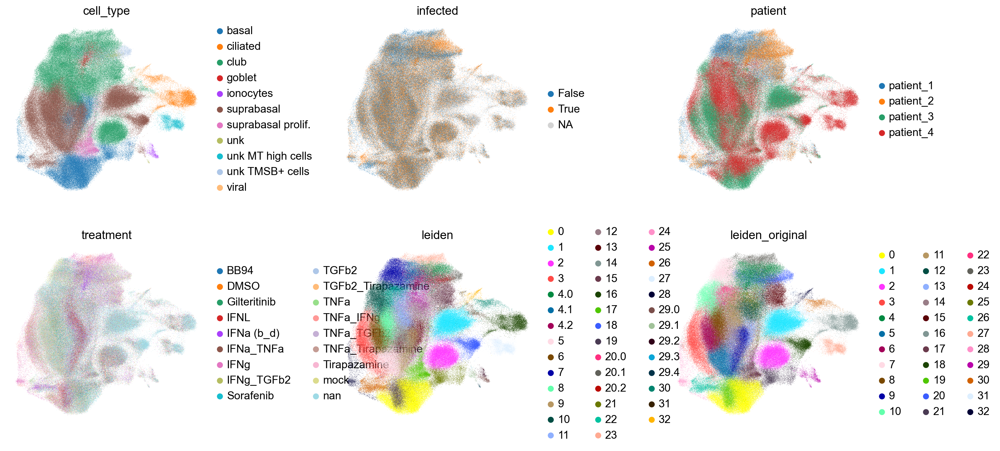

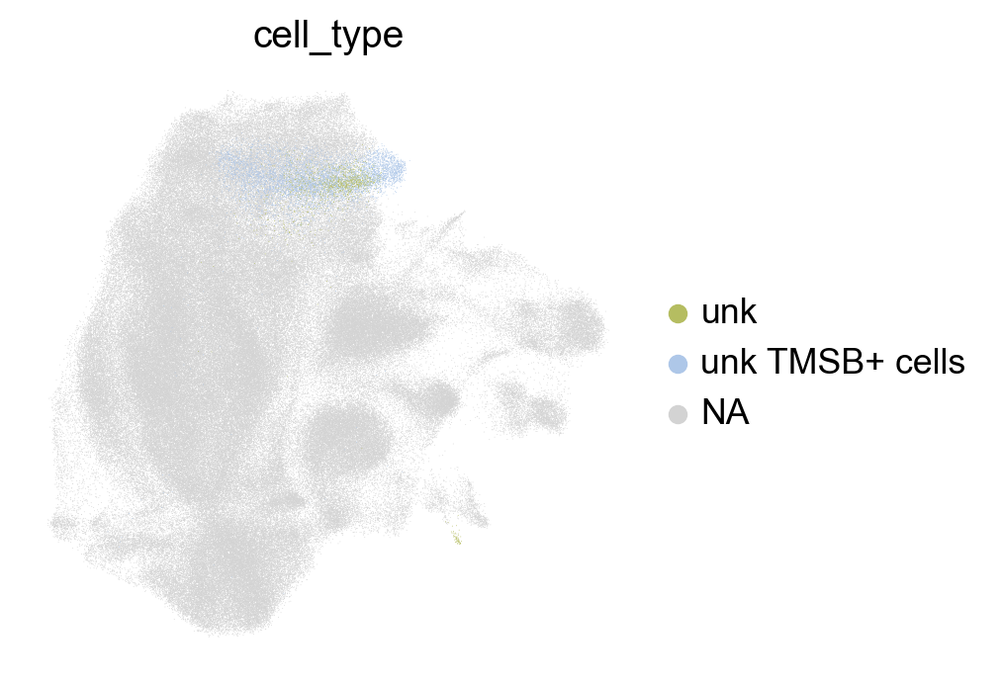

In [5]:
sc.pl.umap(adata, color=['cell_type', 'infected', 'patient', 'treatment', 'leiden', 'leiden_original'], wspace=.5, ncols=3)
sc.pl.umap(adata, color='cell_type', groups=['unk', 'unk TMSB+ cells'])

Let's define this population quantitatively. We're looking for a group of cells which are transcriptionally similar (same leiden cluster) but with a differential transcriptional response due to infection.

In [6]:
def plot_volcano(df):
    """Make a volcano plot from a rank_genes_groups dataframe.
    
    Returns
    -------
    df
        Modified dataframe with plot values.
    up_genes
        Genes with significantly increased differential expression.
    down_genes
        Genes with significantly decreased differential expression.
    """
    fc_thresh = 2
    logpval_thresh = 50
    
    df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
    df = df.replace(np.inf, 325)
    sig_up = df[(df['logfoldchanges'] > fc_thresh) & (df['-log10(pvals)'] > logpval_thresh)].copy()
    sig_down = df[(df['logfoldchanges'] < -fc_thresh) & (df['-log10(pvals)'] > logpval_thresh)].copy()

    # grey - not significant
    plt.scatter(df['logfoldchanges'].values, df['-log10(pvals)'].values, s=4, c='grey')
    # red - up and significant
    plt.scatter(sig_up['logfoldchanges'].values, sig_up['-log10(pvals)'].values, s=4, c='darkred')
    # blue - down and significant
    plt.scatter(sig_down['logfoldchanges'].values, sig_down['-log10(pvals)'].values, s=4)
    
    plt.xlabel('logFC')
    plt.ylabel('-log10(pvals)')
    plt.xlim(-7, 7)  # to avoid plotting super high FC genes caused by dropout
    return df, sig_up.names.values, sig_down.names.values

Example of definite differentially expressed genes.

In [7]:
sc.tl.rank_genes_groups(adata, groupby='cell_type')  # reference = rest

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/statsmodels/iolib/foreign.py:651: DeprecationWarning: `np.long` is a deprecated alias for `np.compat.long`. To silence this warning, use `np.compat.long` by itself. In the likely event your code does not need to work on Python 2 you can use the builtin `int` for which `np.compat.long` is itself an alias. Doing this will not modify any behaviour and is safe. When replacing `np.long`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  _type_converters = {253 : np.long, 252 : int}


198 751


/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in log10
  app.launch_new_instance()


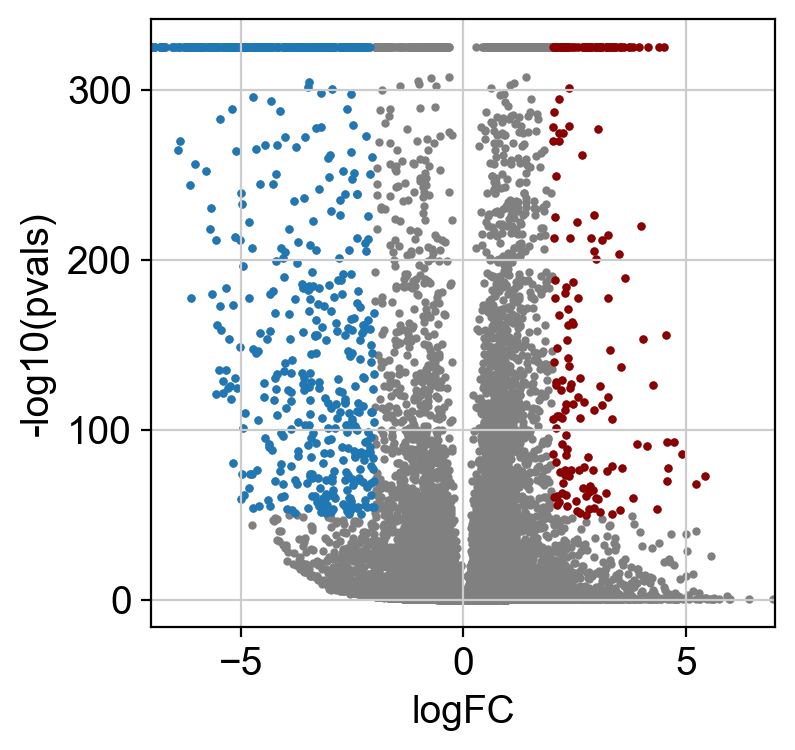

In [8]:
df, up_genes, down_genes = plot_volcano(sc.get.rank_genes_groups_df(adata, group='unk TMSB+ cells'))
print(len(up_genes), len(down_genes))

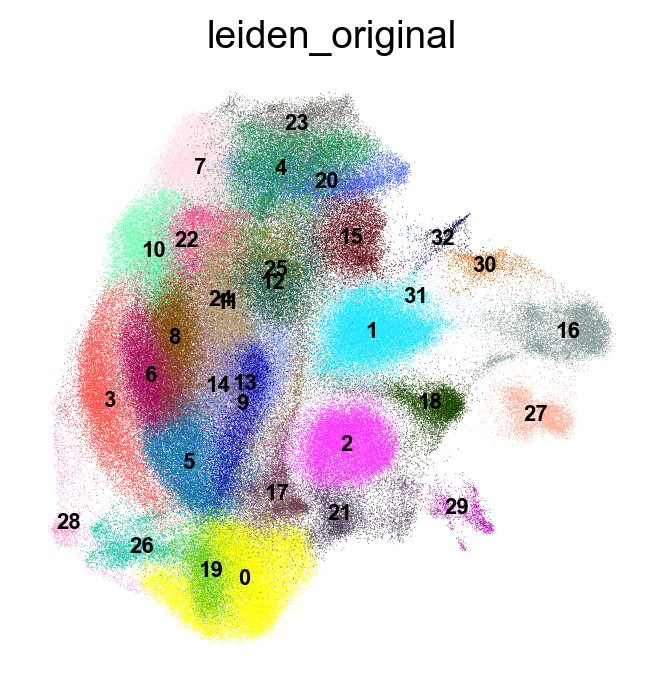

In [11]:
sc.pl.umap(adata, color='leiden_original', legend_loc='on data', legend_fontsize=8)

Trying to set attribute `.uns` of view, copying.


0


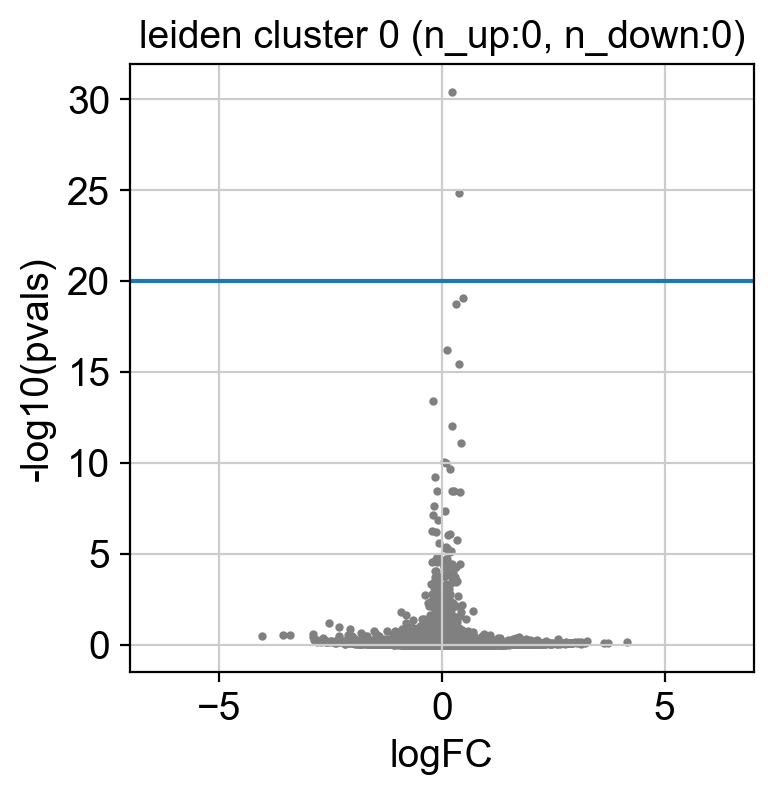

Trying to set attribute `.uns` of view, copying.


1


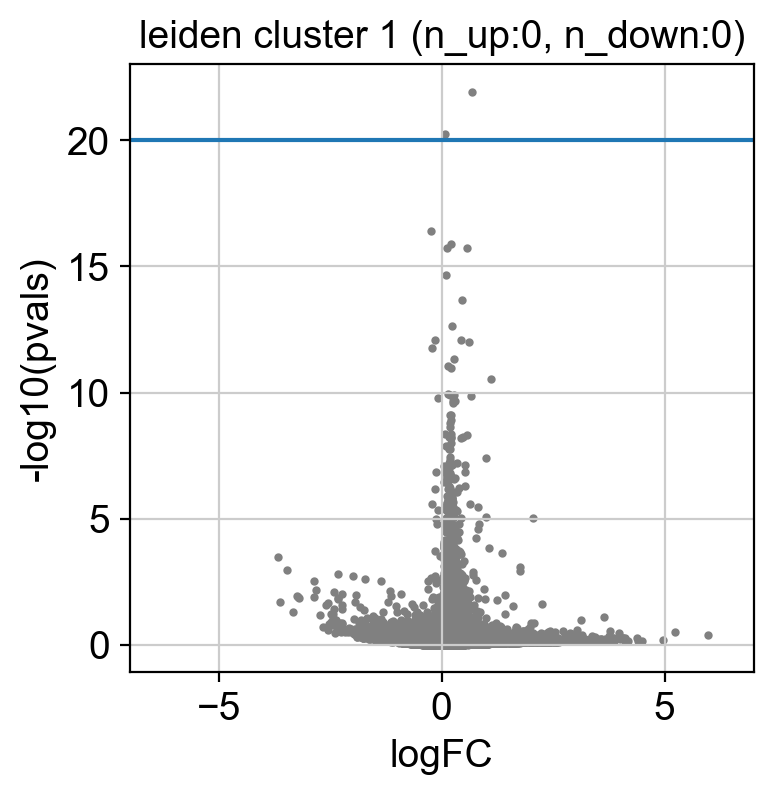

Trying to set attribute `.uns` of view, copying.


2


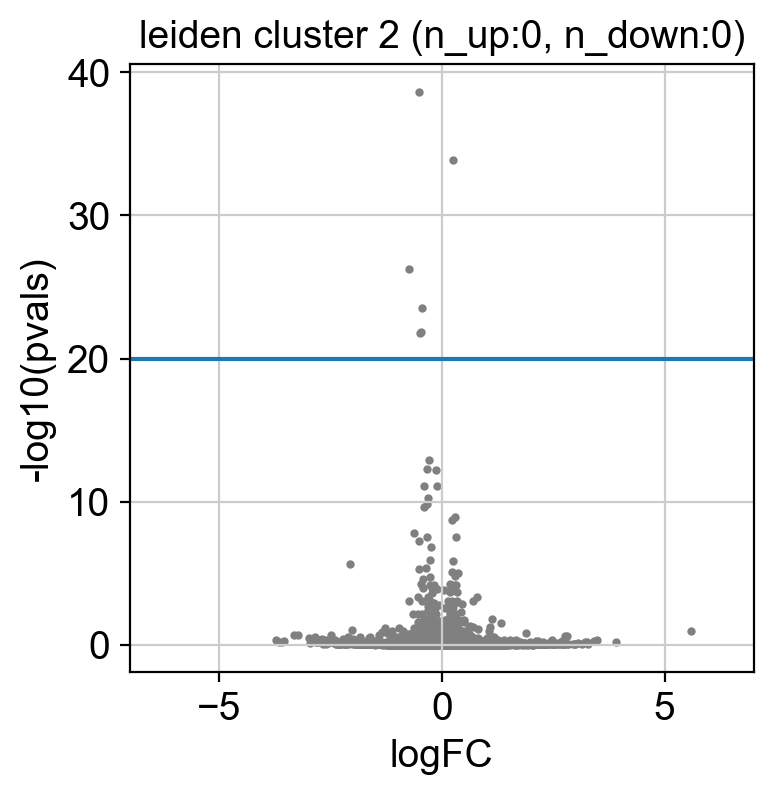

Trying to set attribute `.uns` of view, copying.


3


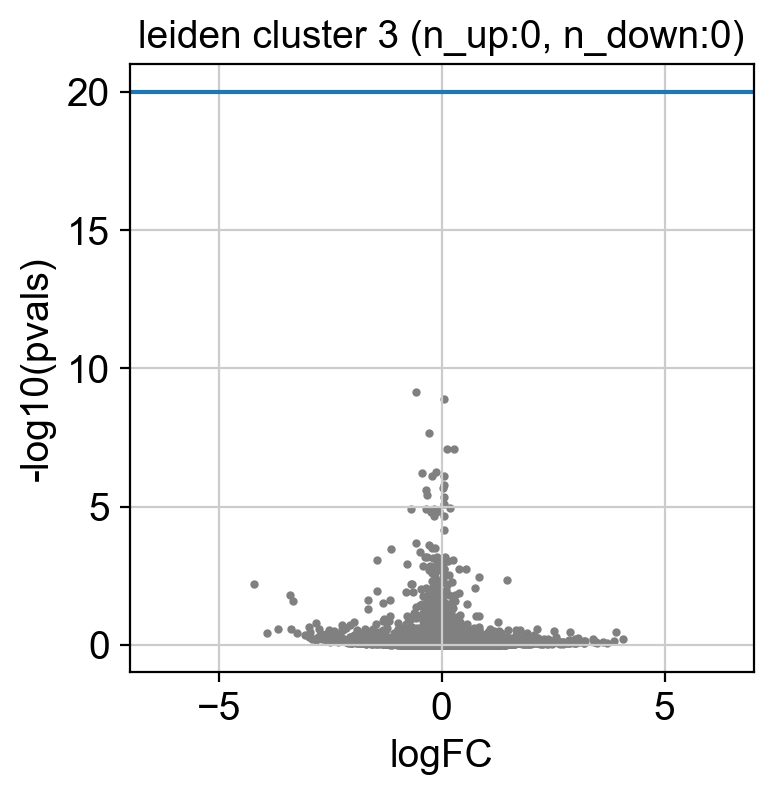

Trying to set attribute `.uns` of view, copying.


4


/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in log10
  app.launch_new_instance()


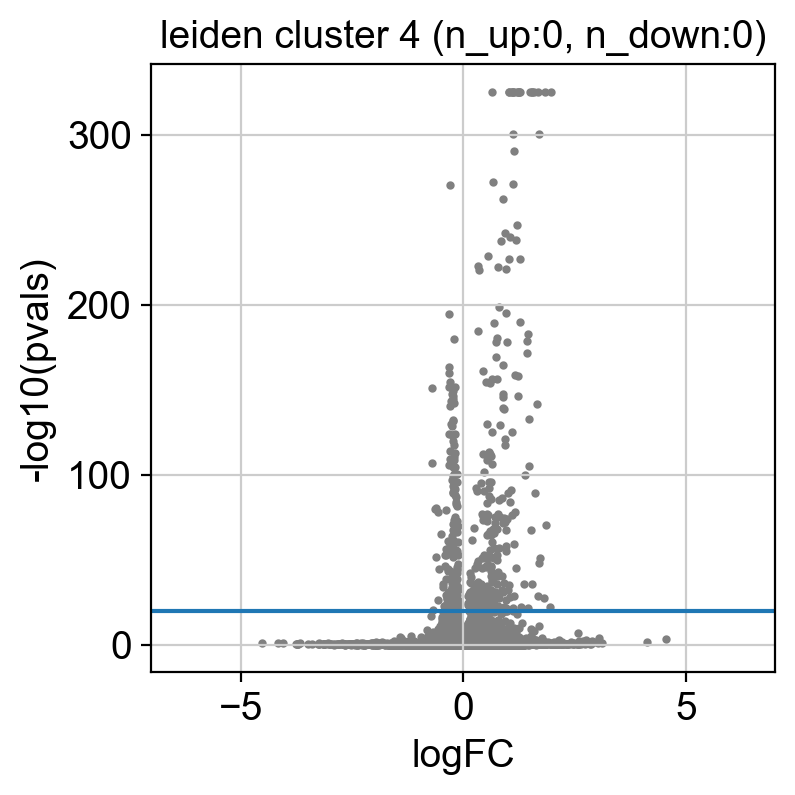

Trying to set attribute `.uns` of view, copying.


5


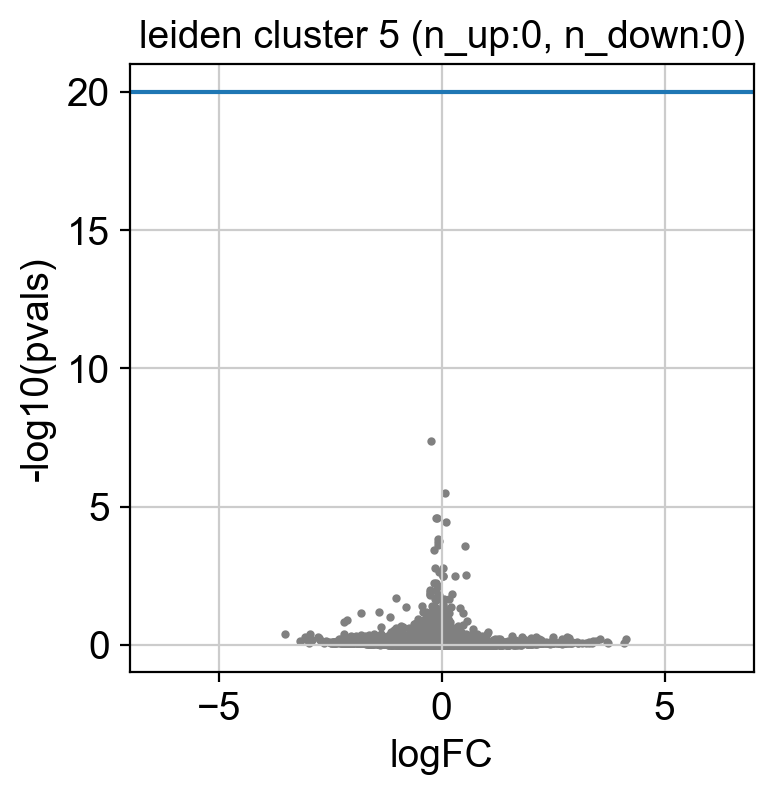

Trying to set attribute `.uns` of view, copying.


6


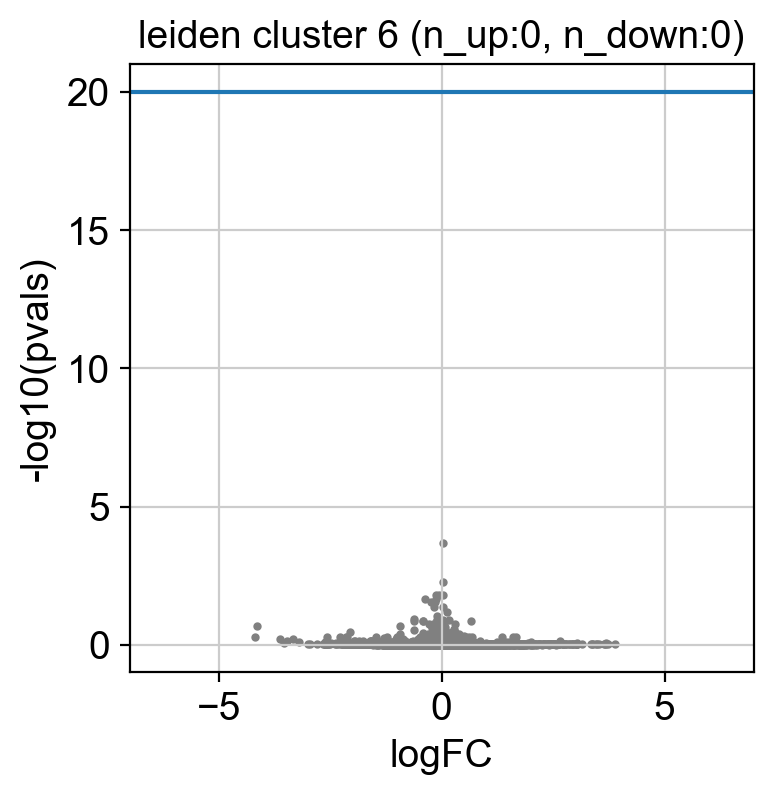

Trying to set attribute `.uns` of view, copying.


7


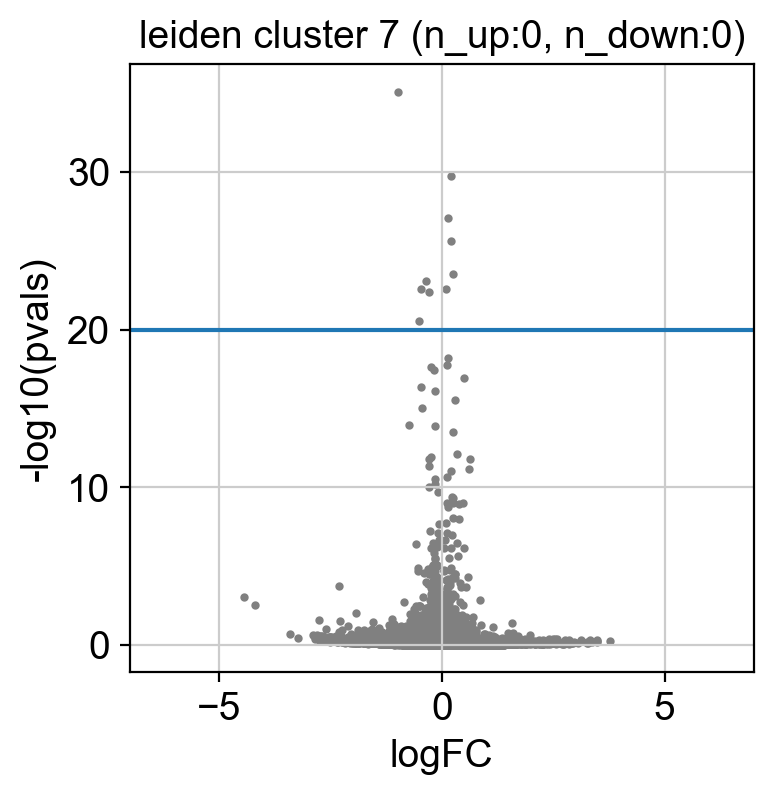

Trying to set attribute `.uns` of view, copying.


8


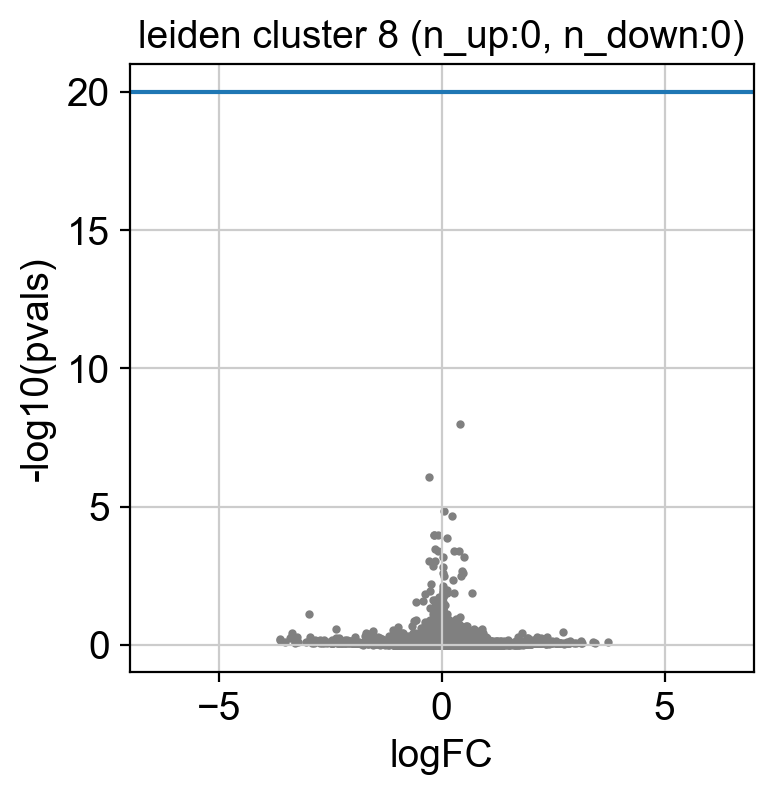

Trying to set attribute `.uns` of view, copying.


9


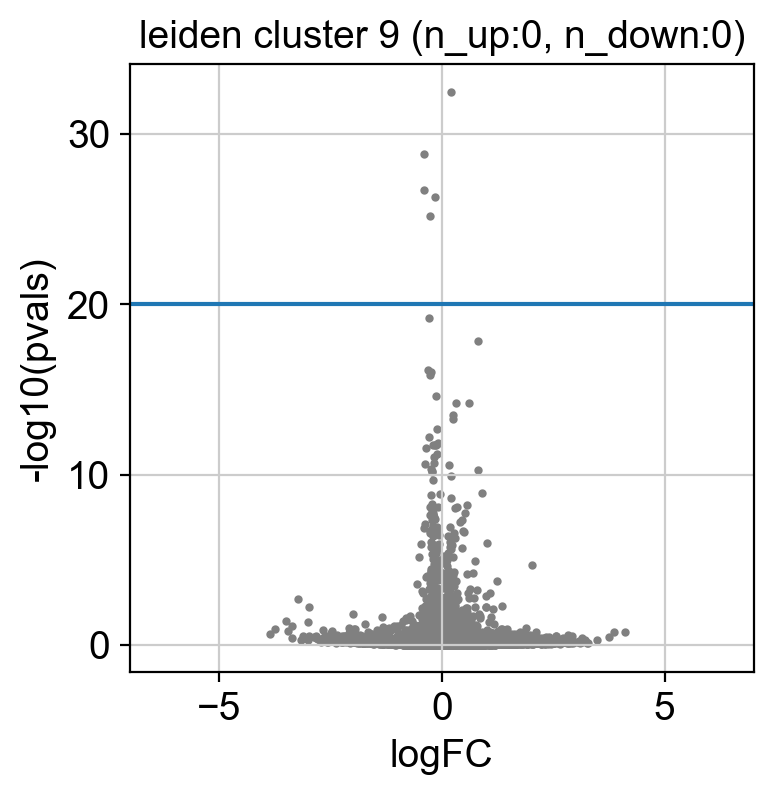

Trying to set attribute `.uns` of view, copying.


10


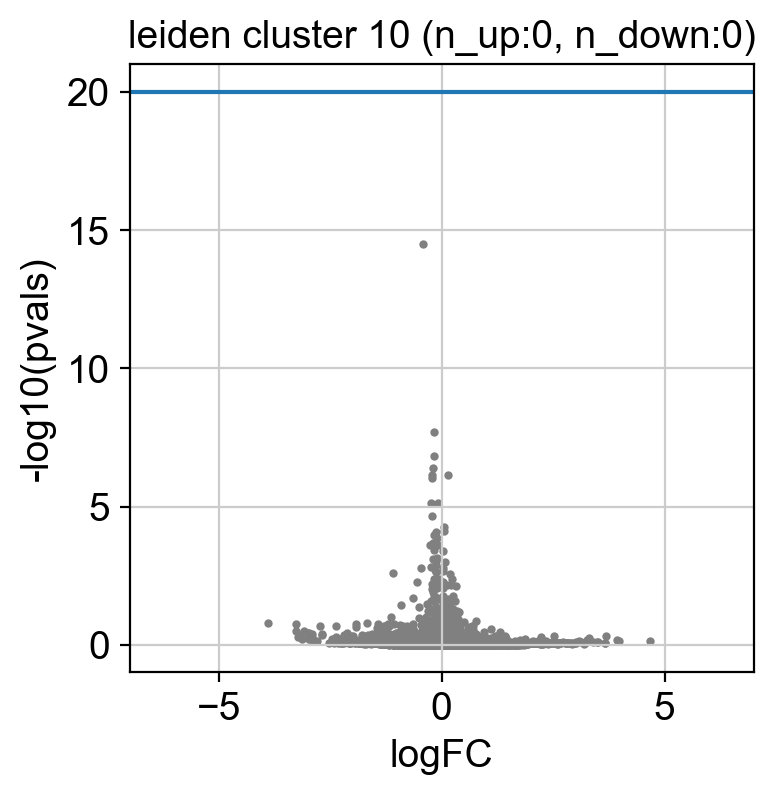

Trying to set attribute `.uns` of view, copying.


11


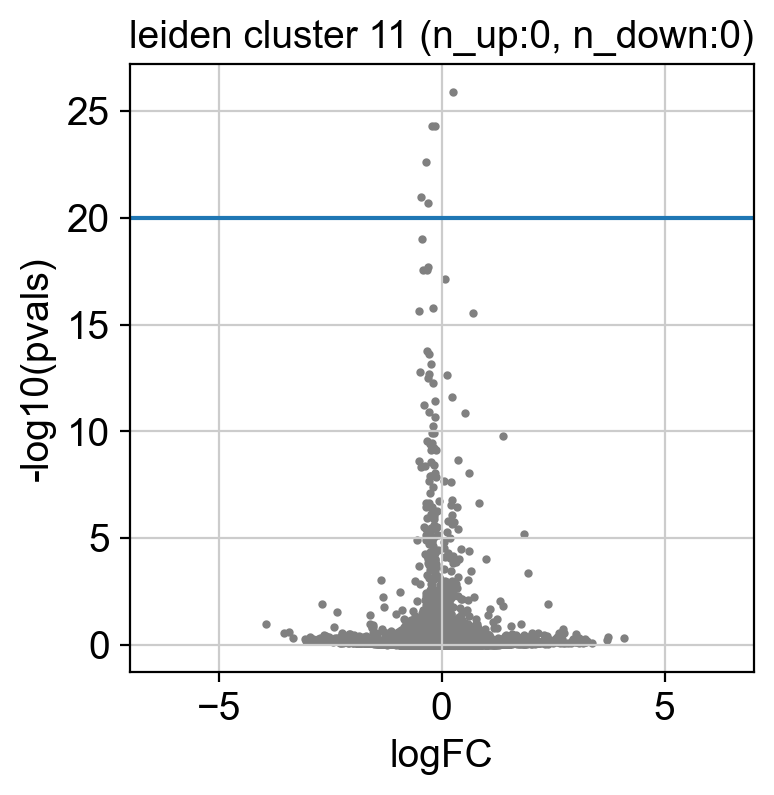

Trying to set attribute `.uns` of view, copying.


12


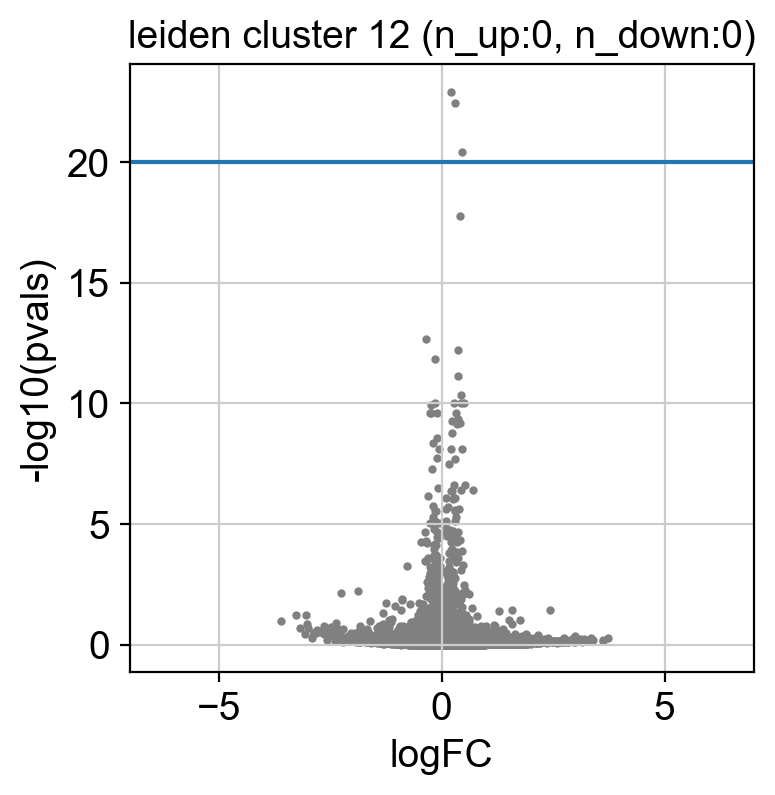

Trying to set attribute `.uns` of view, copying.


13


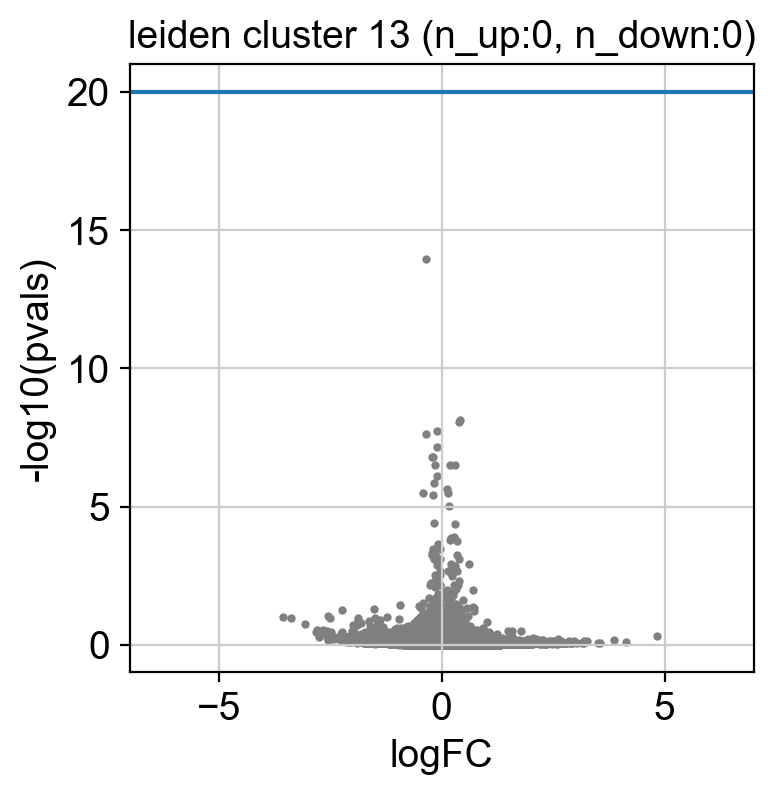

Trying to set attribute `.uns` of view, copying.


14


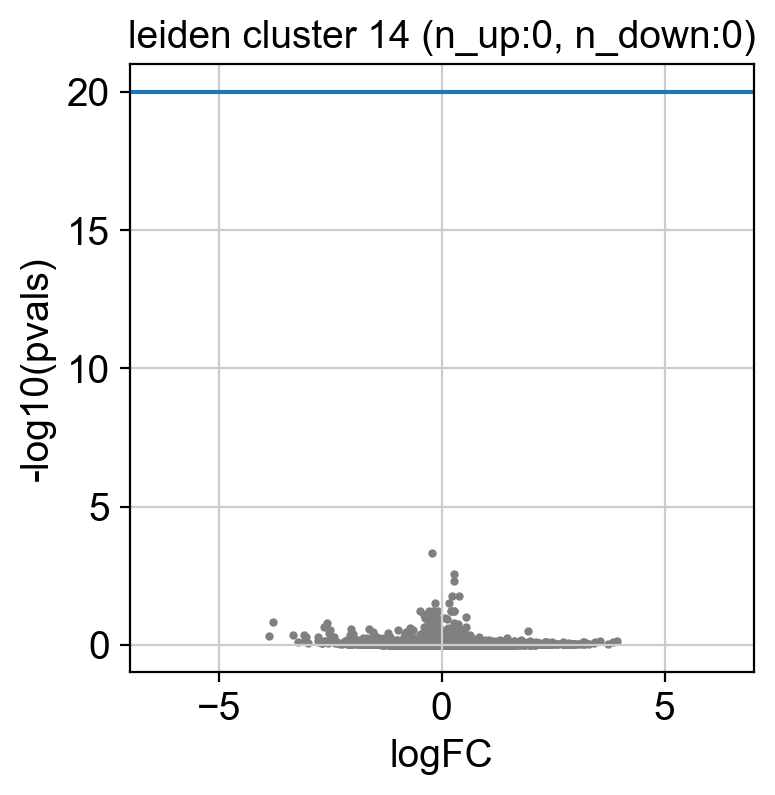

Trying to set attribute `.uns` of view, copying.


15


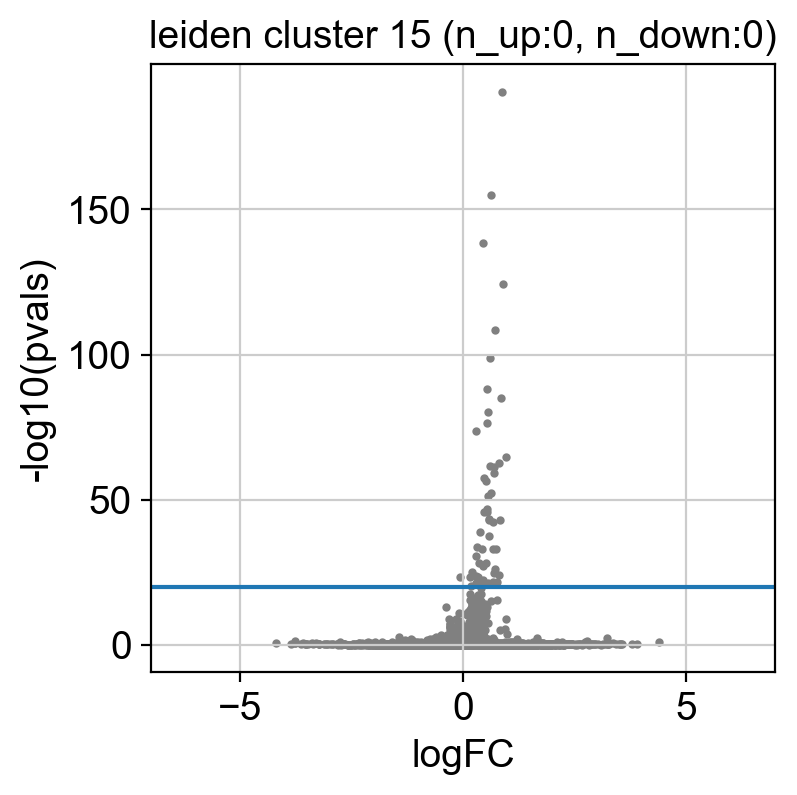

Trying to set attribute `.uns` of view, copying.


16


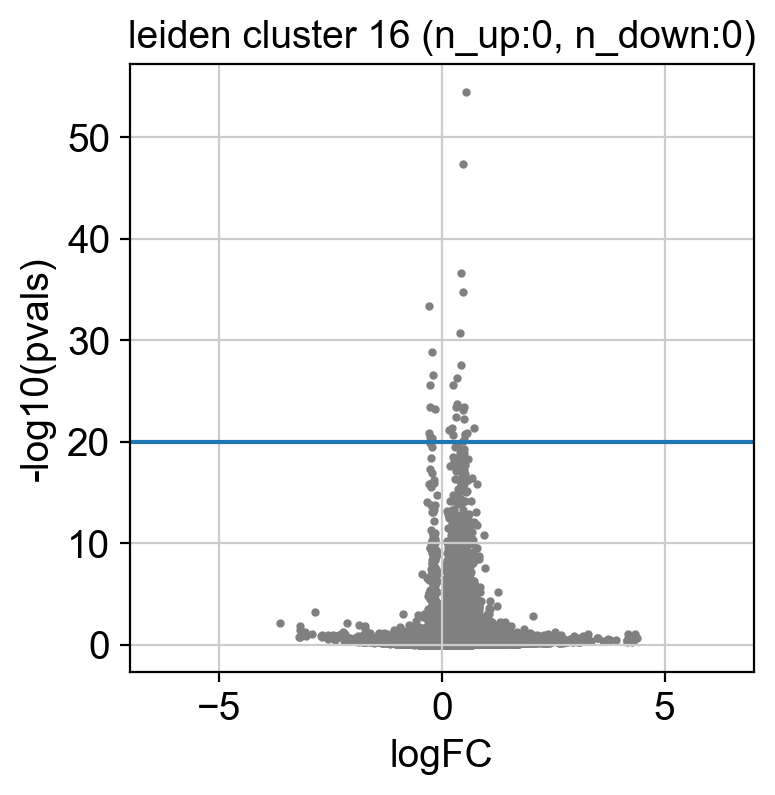

Trying to set attribute `.uns` of view, copying.


17


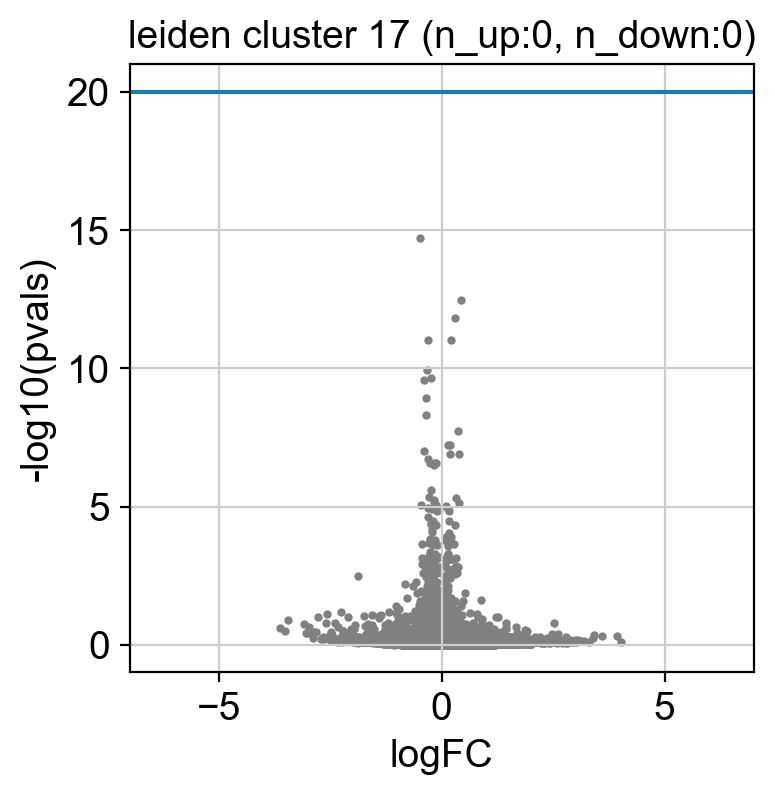

Trying to set attribute `.uns` of view, copying.


18


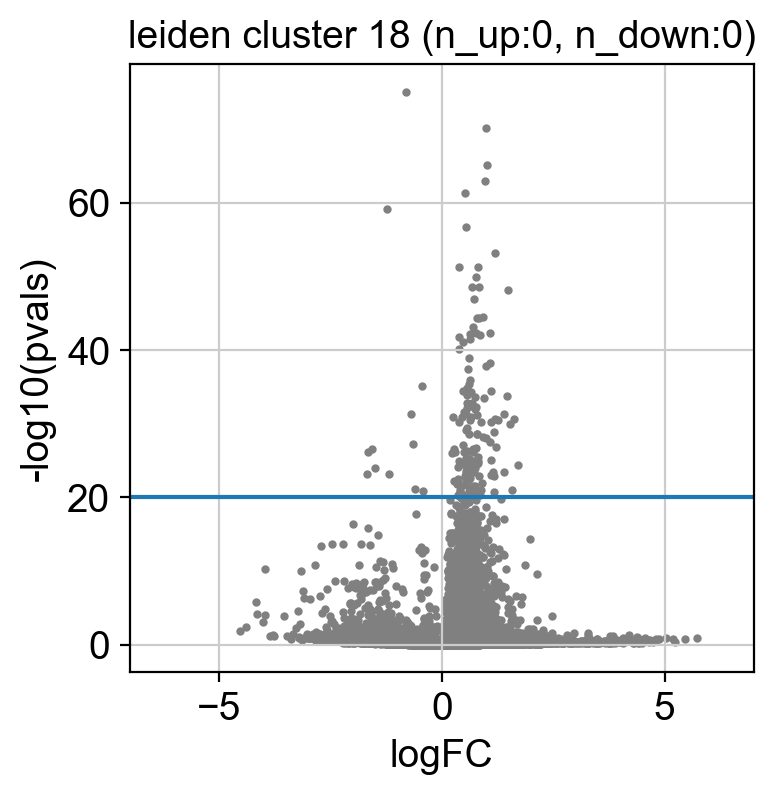

Trying to set attribute `.uns` of view, copying.


19


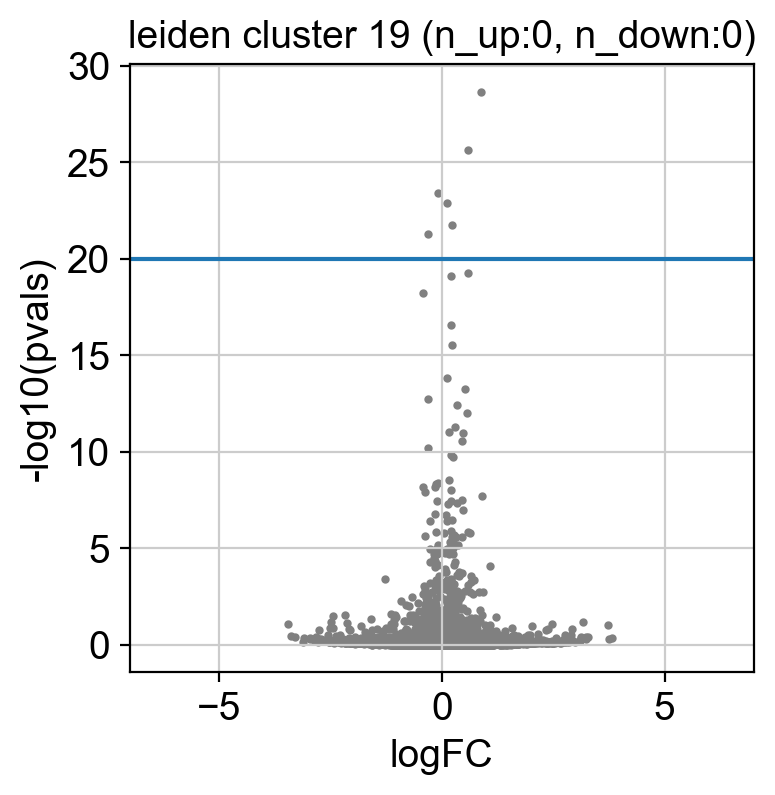

Trying to set attribute `.uns` of view, copying.


20


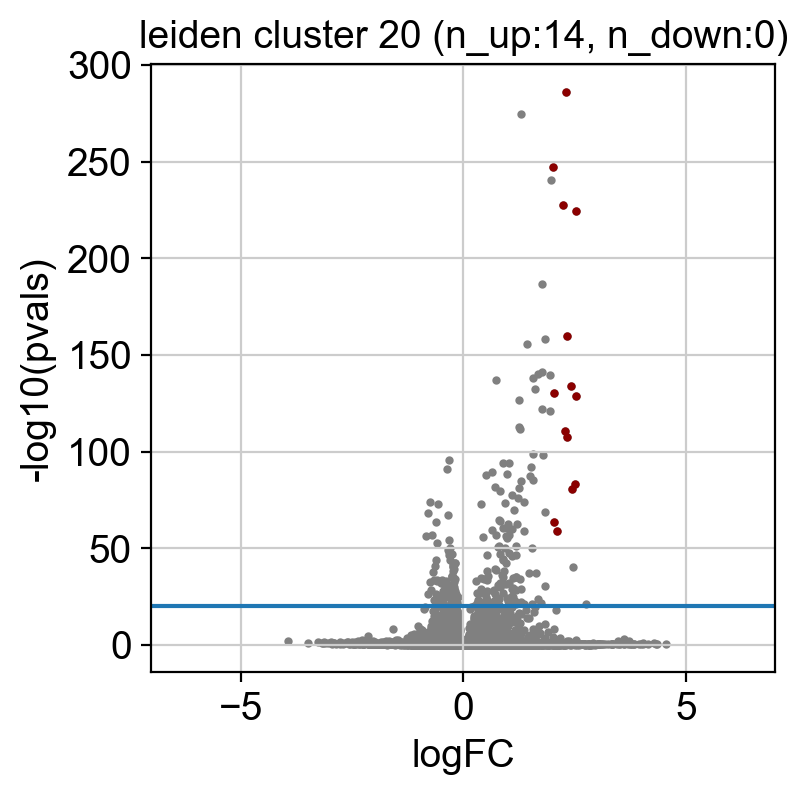

Trying to set attribute `.uns` of view, copying.


21


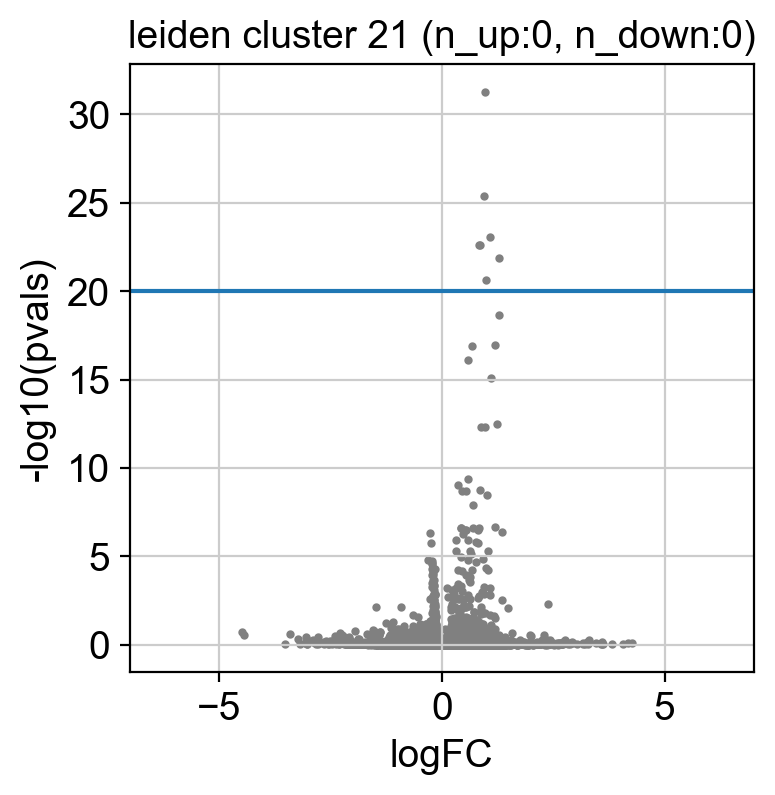

Trying to set attribute `.uns` of view, copying.


22


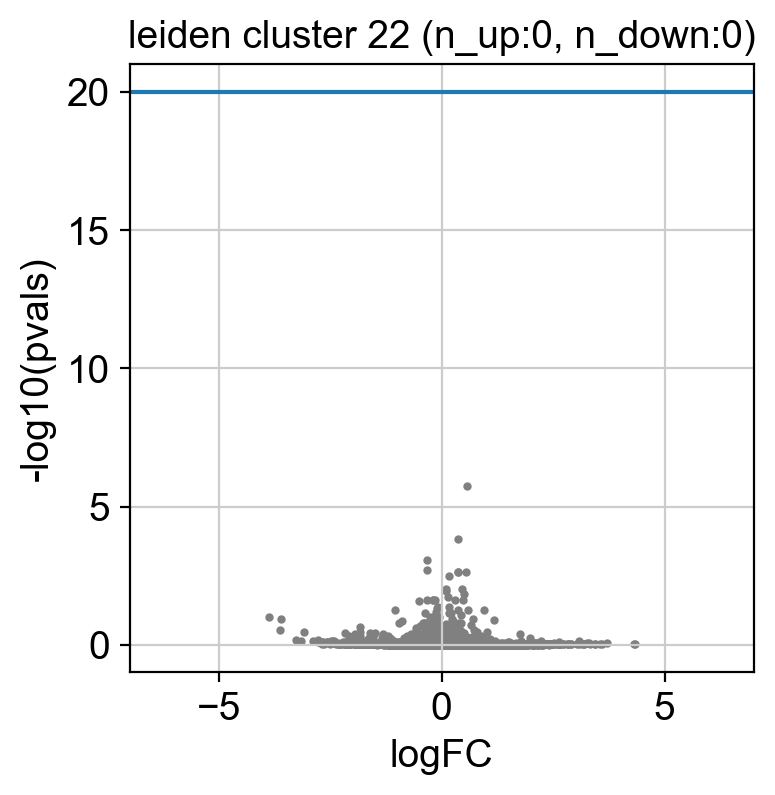

Trying to set attribute `.uns` of view, copying.


23


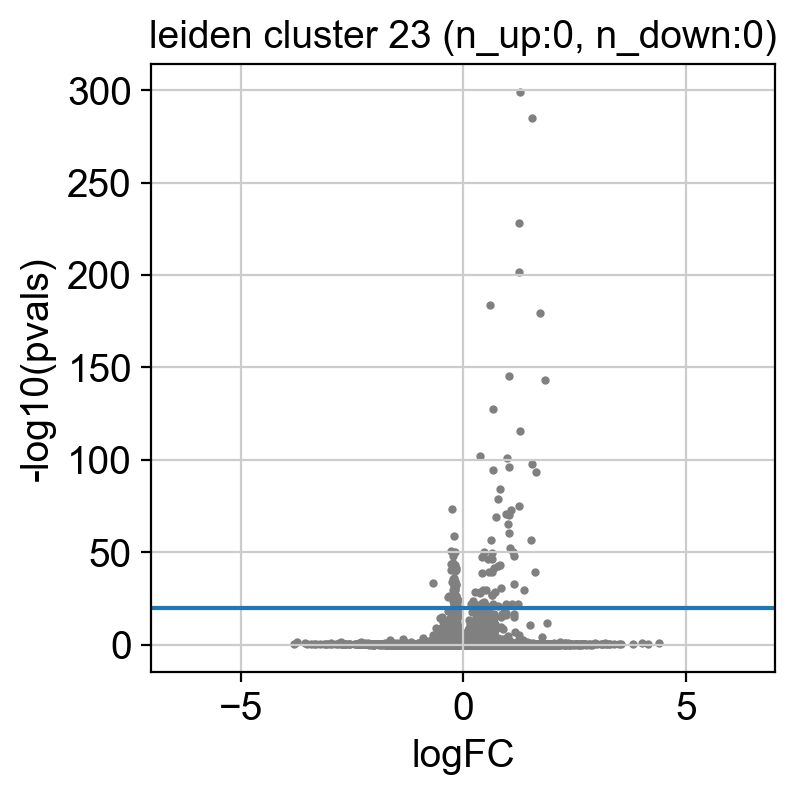

Trying to set attribute `.uns` of view, copying.


24


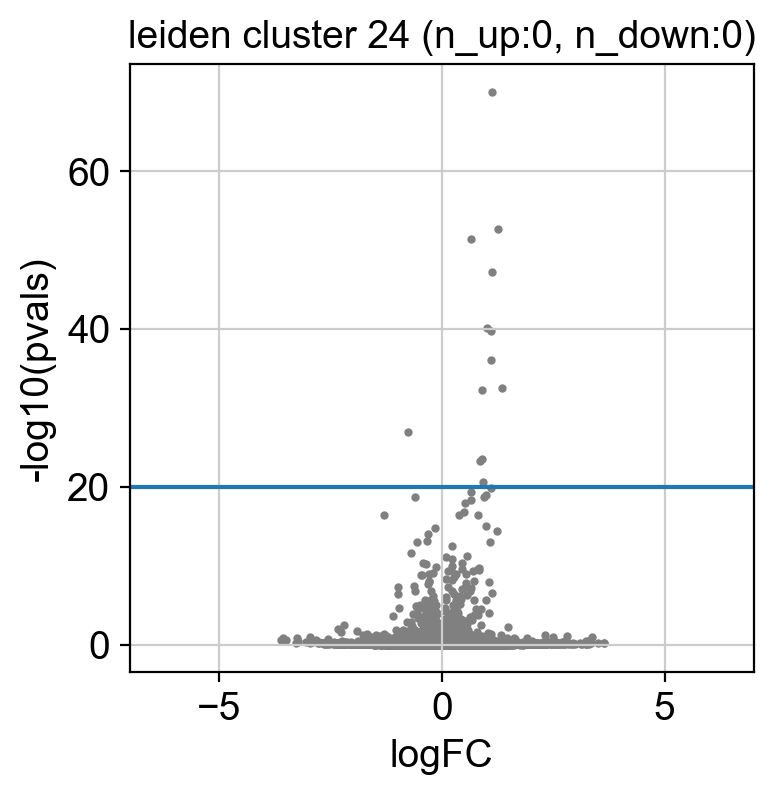

Trying to set attribute `.uns` of view, copying.


25


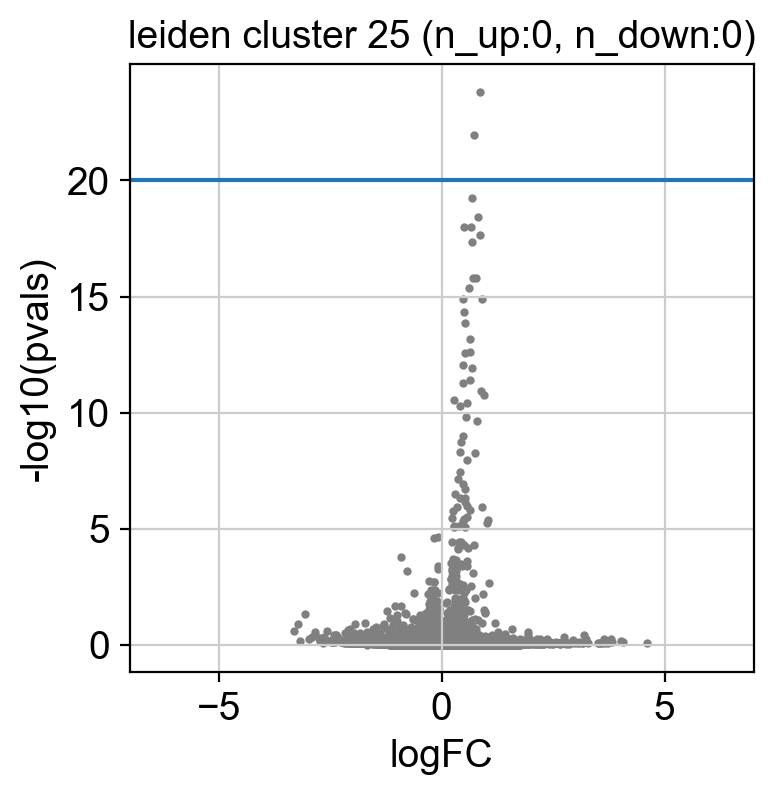

Trying to set attribute `.uns` of view, copying.


26


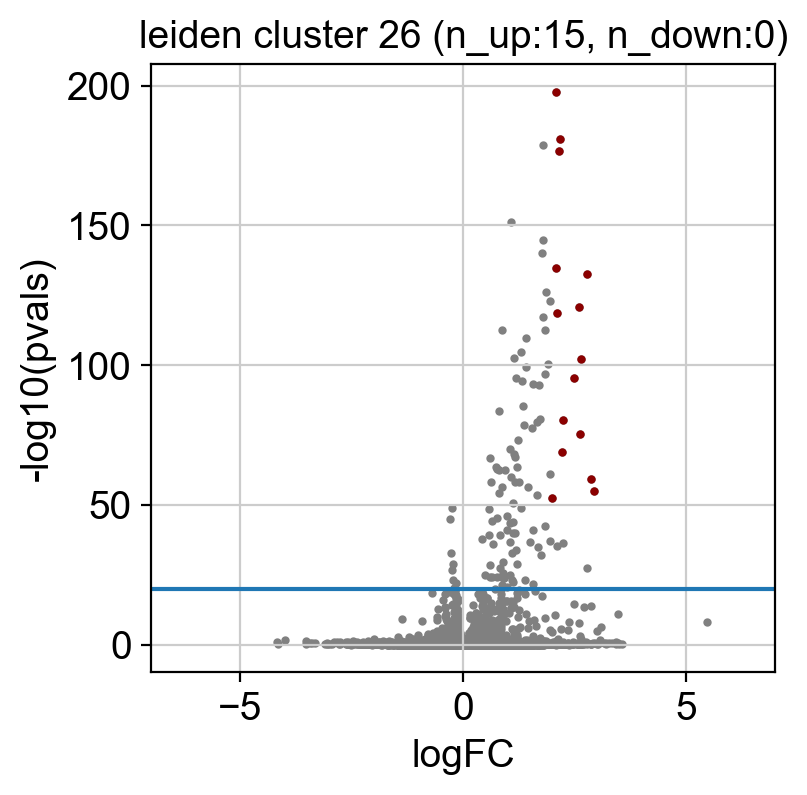

Trying to set attribute `.uns` of view, copying.


27


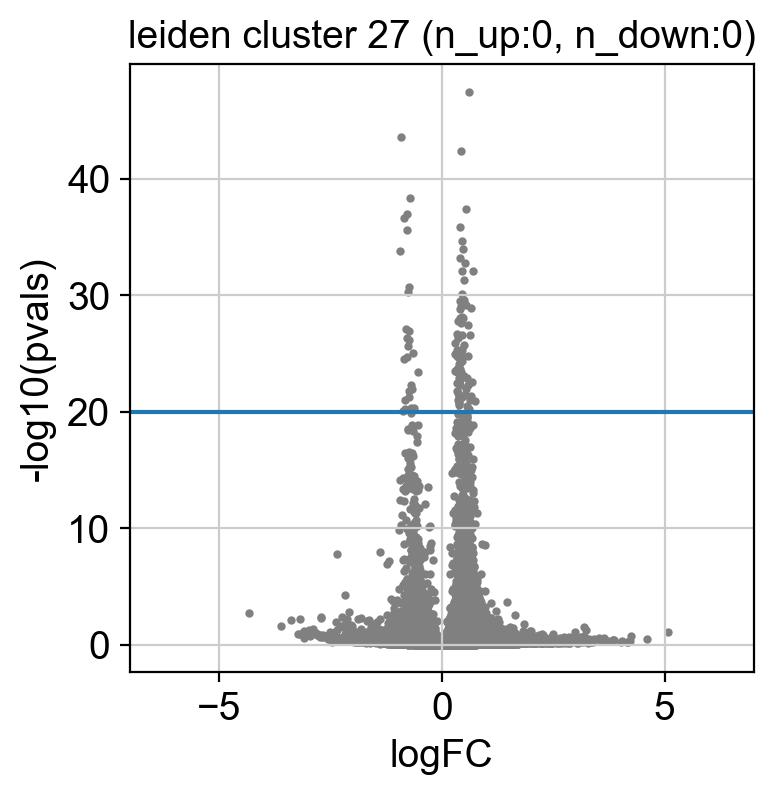

Trying to set attribute `.uns` of view, copying.


28


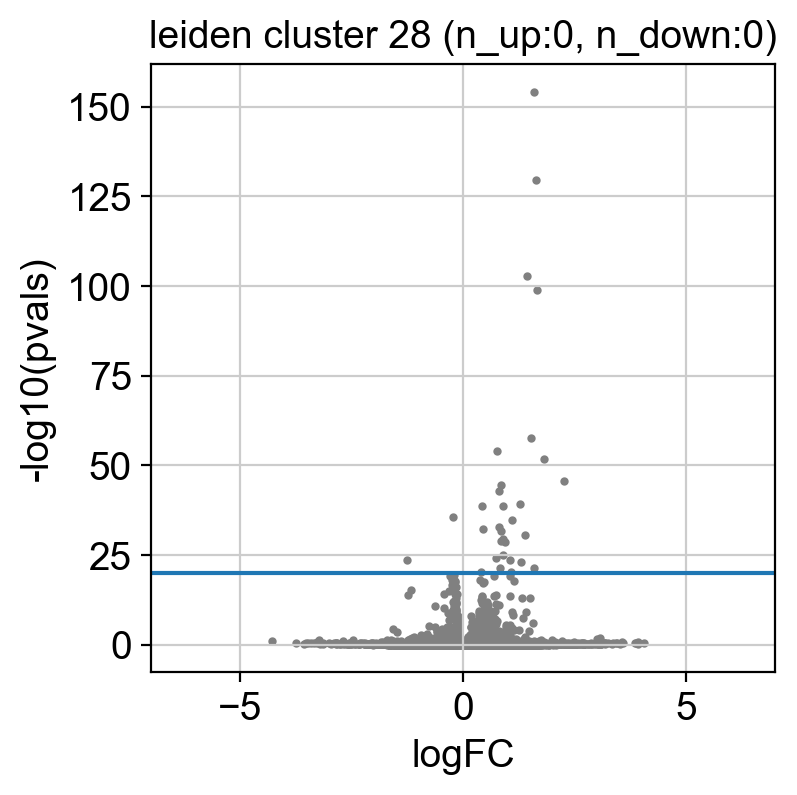

Trying to set attribute `.uns` of view, copying.


29


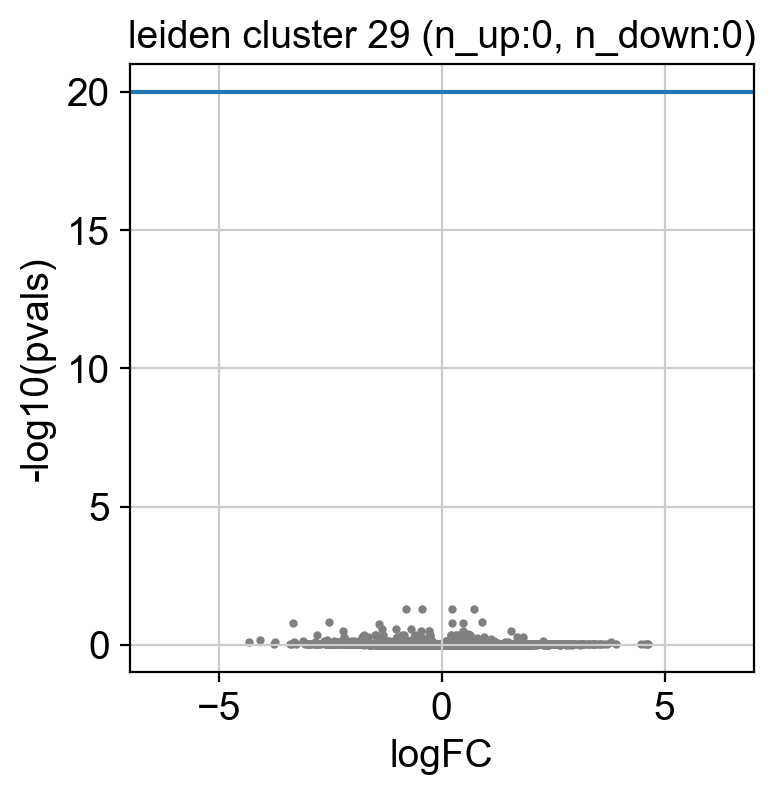

Trying to set attribute `.uns` of view, copying.


30


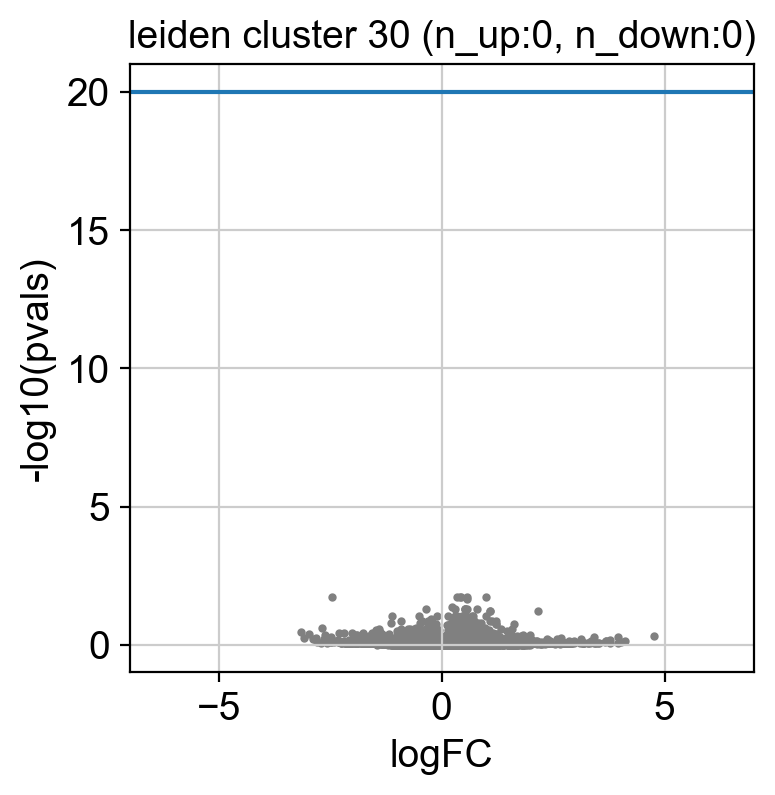

Trying to set attribute `.uns` of view, copying.


31


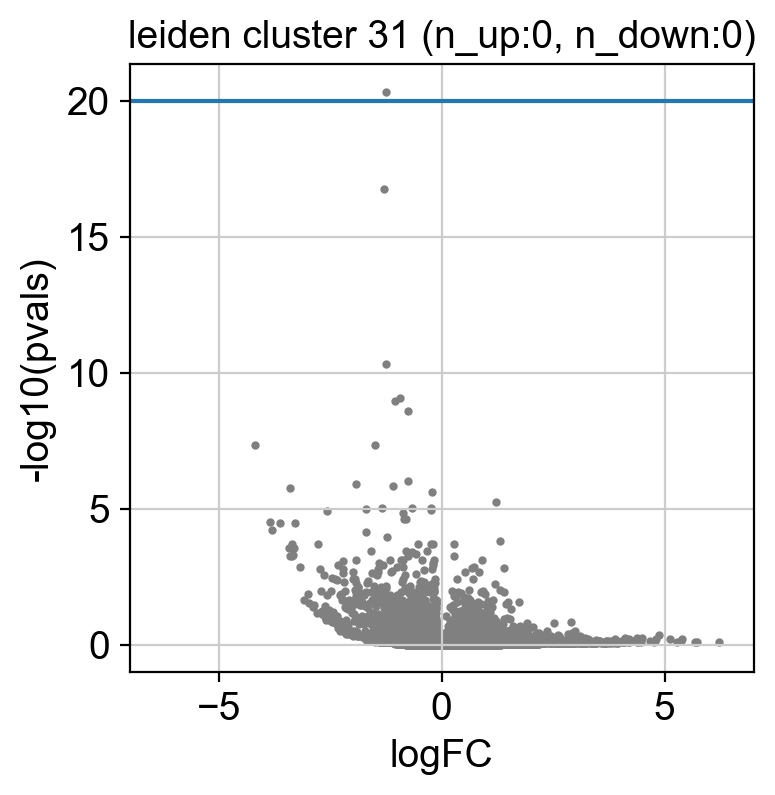

Trying to set attribute `.uns` of view, copying.


32


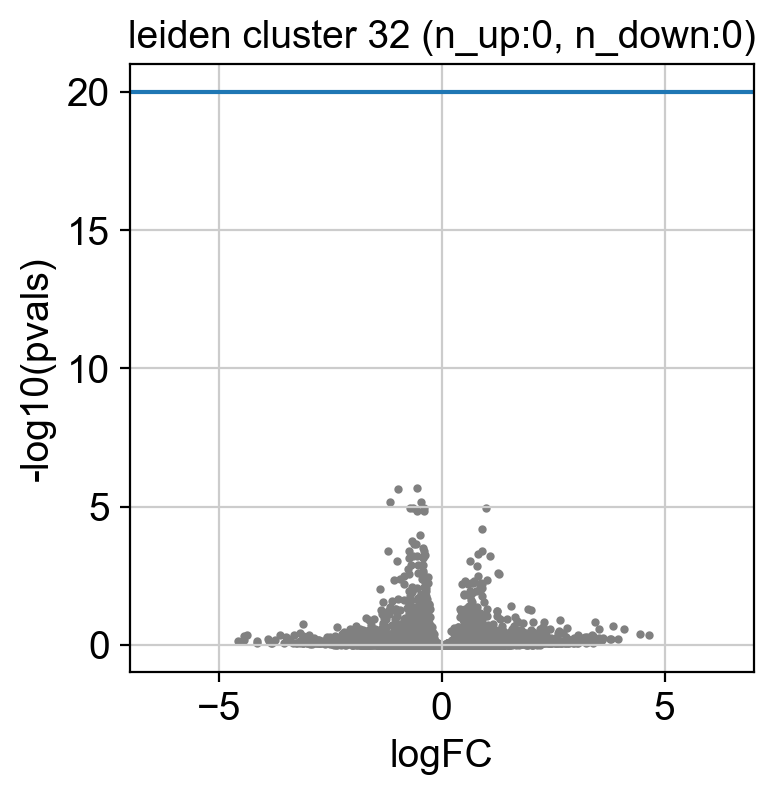

In [12]:
valid_clusters = []
cluster_resp = {}  # general measure of cluster responsiveness - # of genes with sig pval
for c in adata.obs.leiden_original.cat.categories:
    subset = adata[adata.obs.leiden_original == c]
    sc.tl.rank_genes_groups(subset, groupby='infected')
    df, up_genes, down_genes = plot_volcano(sc.get.rank_genes_groups_df(subset, group='True'))

    print(c)
    plt.title(f'leiden cluster {c} (n_up:{len(up_genes)}, n_down:{len(down_genes)})')
    plt.axhline(20)
    plt.show()
    
    cluster_resp[c] = df[df['-log10(pvals)'] > 20].shape[0]
    if len(up_genes) + len(down_genes) > 5:
        valid_clusters.append(c)

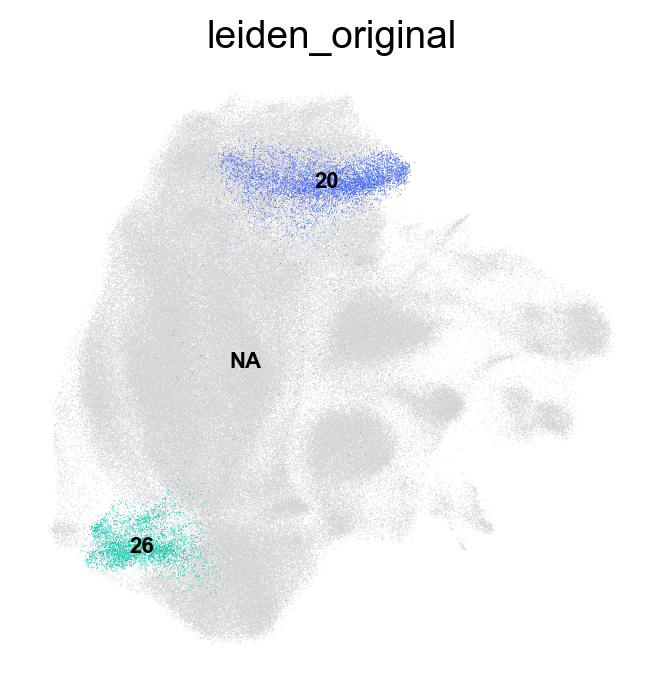

In [14]:
sc.pl.umap(adata, color='leiden_original', groups=valid_clusters, legend_loc='on data', legend_fontsize=8)

Is there a general trend towards responsiveness as well?

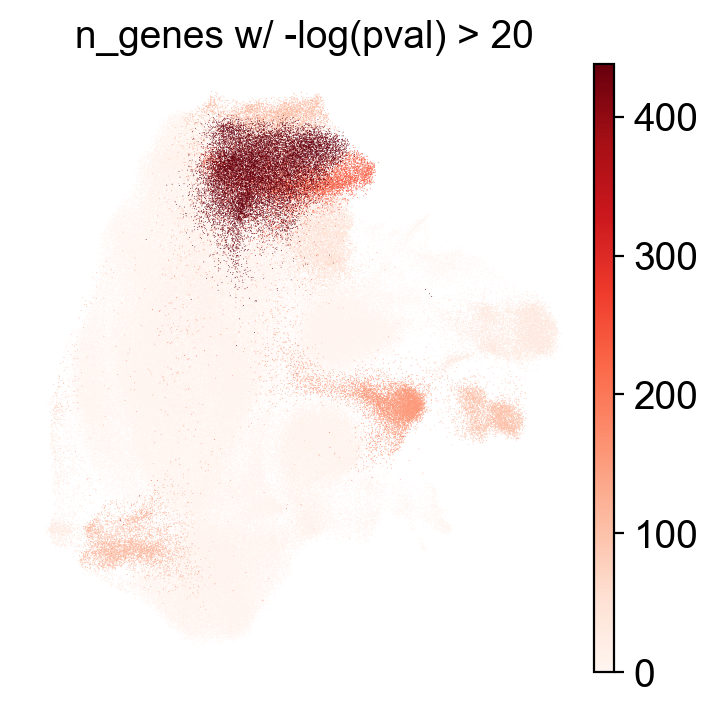

In [15]:
adata.obs['n_genes w/ -log(pval) > 20'] = adata.obs['leiden_original'].map(cluster_resp).astype(float)
sc.pl.umap(adata, color='n_genes w/ -log(pval) > 20', cmap='Reds')

In [16]:
sc.tl.rank_genes_groups(adata, groupby='leiden_original')  # reference = rest

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]


In [18]:
# to allow plotting
adata = adata[adata.obs.treatment != 'nan']

Trying to set attribute `.uns` of view, copying.


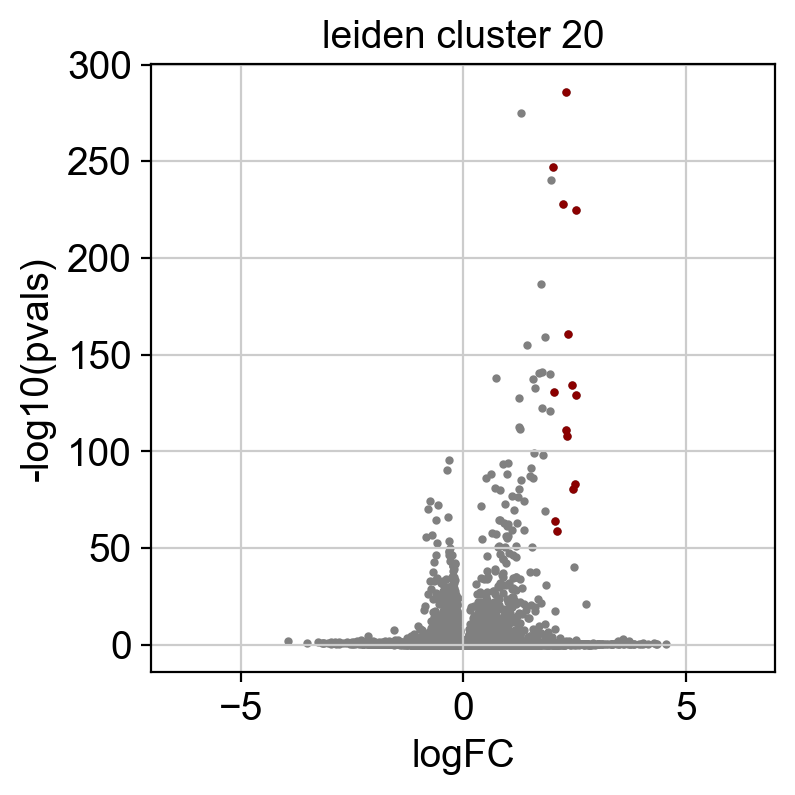

,name,p_value,intersections
0,Hepatitis C,0.000064,"[IFIT1, MX2, OAS2, RSAD2]"
1,Influenza A,0.001637,"[MX2, OAS2, RSAD2]"
2,Coronavirus disease - COVID-19,0.003022,"[ISG15, MX2, OAS2]"
3,Human papillomavirus infection,0.006503,"[ISG15, MX2, OASL]"
4,Measles,0.012943,"[MX2, OAS2]"
5,Epstein-Barr virus infection,0.023174,"[ISG15, OAS2]"


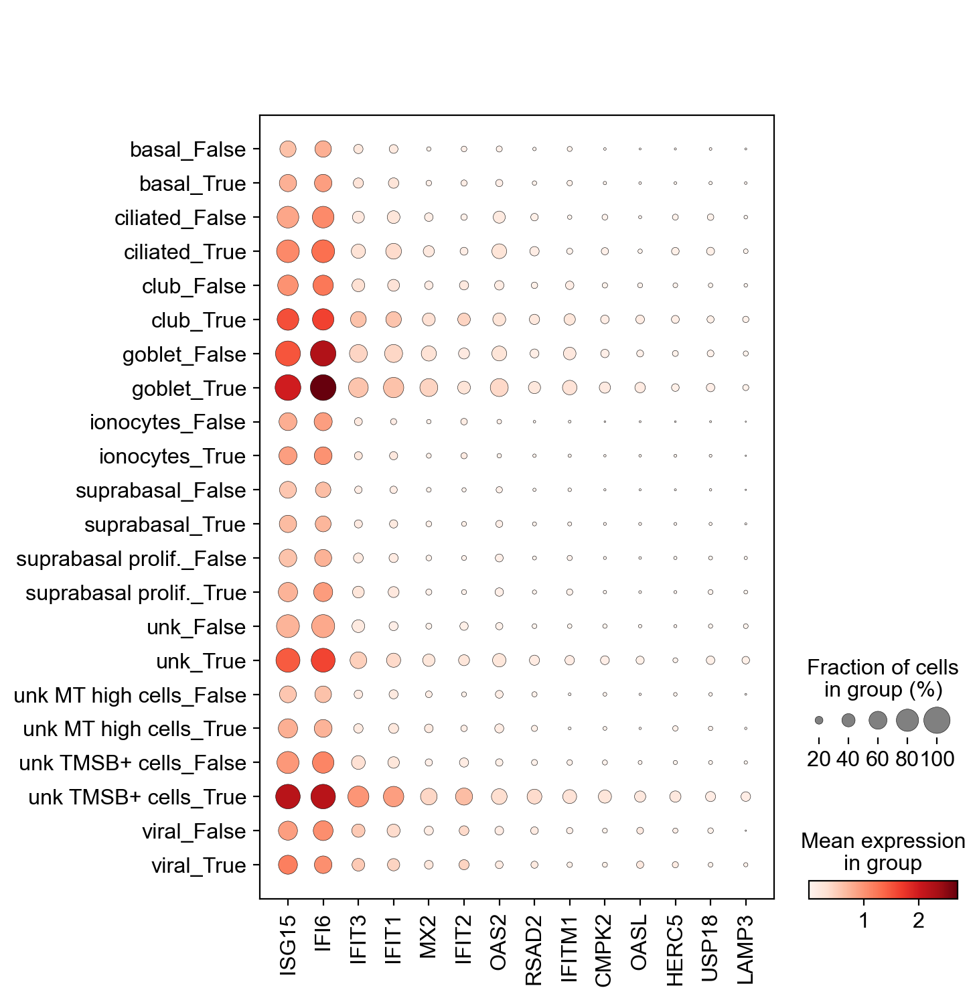

cluster specific markers


/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in log10
  app.launch_new_instance()


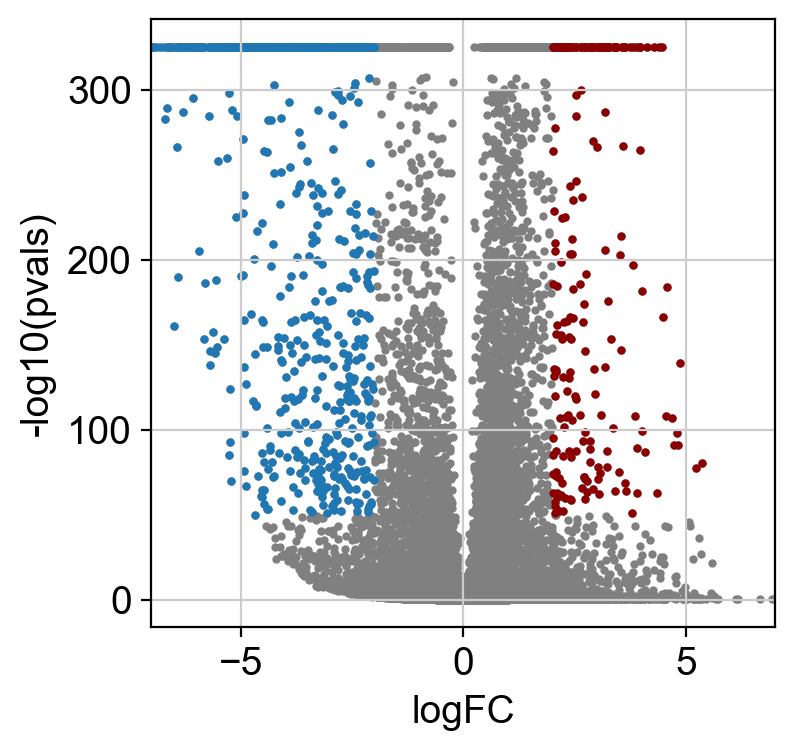

,name,p_value,intersections
0,Cytokine-cytokine receptor interaction,8.711330e-15,"[TNFRSF12A, CXCL8, GDF15, IL32, CXCL1, CXCL2, ..."
1,Rheumatoid arthritis,6.163835e-14,"[CXCL8, CXCL1, CXCL2, ICAM1, CCL20, CXCL3, TGF..."
2,IL-17 signaling pathway,7.688420e-14,"[LCN2, CXCL8, NFKBIA, CXCL1, CXCL2, TNFAIP3, C..."
3,TNF signaling pathway,2.177298e-13,"[NFKBIA, CXCL1, CXCL2, ICAM1, TNFAIP3, EDN1, C..."
4,Viral protein interaction with cytokine and cy...,5.984167e-10,"[CXCL8, CXCL1, CXCL2, CCL20, CXCL3, CXCL6, CCL..."
5,NF-kappa B signaling pathway,1.825156e-08,"[PLAU, CXCL8, NFKBIA, CXCL1, CXCL2, ICAM1, TNF..."
6,Leishmaniasis,7.189261e-07,"[C3, NFKBIA, PTGS2, TGFB2, NCF2, IL1A, HLA-DRB..."
7,Legionellosis,1.314330e-06,"[C3, CXCL8, NFKBIA, CXCL1, CXCL2, CXCL3, IL1B,..."
8,Amoebiasis,8.778837e-06,"[CXCL8, CXCL1, CXCL2, CXCL3, TGFB2, FN1, IL1B,..."
9,Pertussis,1.066949e-05,"[C3, CXCL8, CXCL6, CXCL5, IL1A, IL1B, TNF, IL6..."


,name,p_value,intersections
0,Drug metabolism - cytochrome P450,2.106157e-07,"[MAOB, CYP2A6, GSTA3, UGT2A1, GSTM1, UGT1A7, G..."
1,Metabolism of xenobiotics by cytochrome P450,2.678543e-06,"[CYP2A6, GSTA3, UGT2A1, GSTM1, UGT1A7, GSTM2, ..."
2,Retinol metabolism,1.955172e-04,"[CYP2A6, UGT2A1, UGT1A7, ADH6, ADH4, CYP2C9, U..."
3,Chemical carcinogenesis - DNA adducts,7.266008e-04,"[CYP2A6, GSTA3, UGT2A1, GSTM1, UGT1A7, GSTM2, ..."
4,Cell cycle,7.834356e-04,"[ESPL1, ORC1, CDC25C, BUB1, E2F2, PKMYT1, CDC4..."
5,Drug metabolism - other enzymes,1.072277e-02,"[CYP2A6, GSTA3, UGT2A1, GSTM1, UGT1A7, GSTM2, ..."
6,Chemical carcinogenesis - reactive oxygen species,1.072277e-02,"[GSTA3, GSTM1, GSTM2, GSTA2, EPHX2, MT-ATP8, C..."
7,Oxidative phosphorylation,1.086719e-02,"[ATP6V0A4, MT-ATP8, MT-ND4L, MT-CO2, MT-CYB, M..."
8,Huntington disease,3.732756e-02,"[DNAH2, DNAH11, DNAH3, DNAI2, DNAI1, DNAH7, DN..."


,name,p_value,intersections
0,Drug metabolism - cytochrome P450,0.000007,"[MAOB, CYP2A6, GSTA3, UGT2A1, GSTM1, UGT1A7, G..."
1,Cytokine-cytokine receptor interaction,0.000007,"[TNFRSF12A, CXCL8, GDF15, IL32, CXCL1, CXCL2, ..."
2,Rheumatoid arthritis,0.000007,"[CXCL8, CXCL1, CXCL2, ICAM1, CCL20, CXCL3, TGF..."
3,IL-17 signaling pathway,0.000010,"[LCN2, CXCL8, NFKBIA, CXCL1, CXCL2, TNFAIP3, C..."
4,Metabolism of xenobiotics by cytochrome P450,0.000050,"[CYP2A6, GSTA3, UGT2A1, GSTM1, UGT1A7, GSTM2, ..."
5,TNF signaling pathway,0.000291,"[NFKBIA, CXCL1, CXCL2, ICAM1, TNFAIP3, EDN1, C..."
6,Viral protein interaction with cytokine and cy...,0.000300,"[CXCL8, CXCL1, CXCL2, CCL20, CXCL3, CXCL6, CCL..."
7,Retinol metabolism,0.000320,"[ALDH1A3, CYP2A6, UGT2A1, UGT1A7, ADH6, ADH4, ..."
8,Cell cycle,0.000415,"[CDKN2A, CDKN2B, TGFB2, ESPL1, ORC1, CDC25C, B..."
9,Chemical carcinogenesis - DNA adducts,0.001038,"[PTGS2, CYP2A6, GSTA3, UGT2A1, GSTM1, UGT1A7, ..."


Trying to set attribute `.uns` of view, copying.


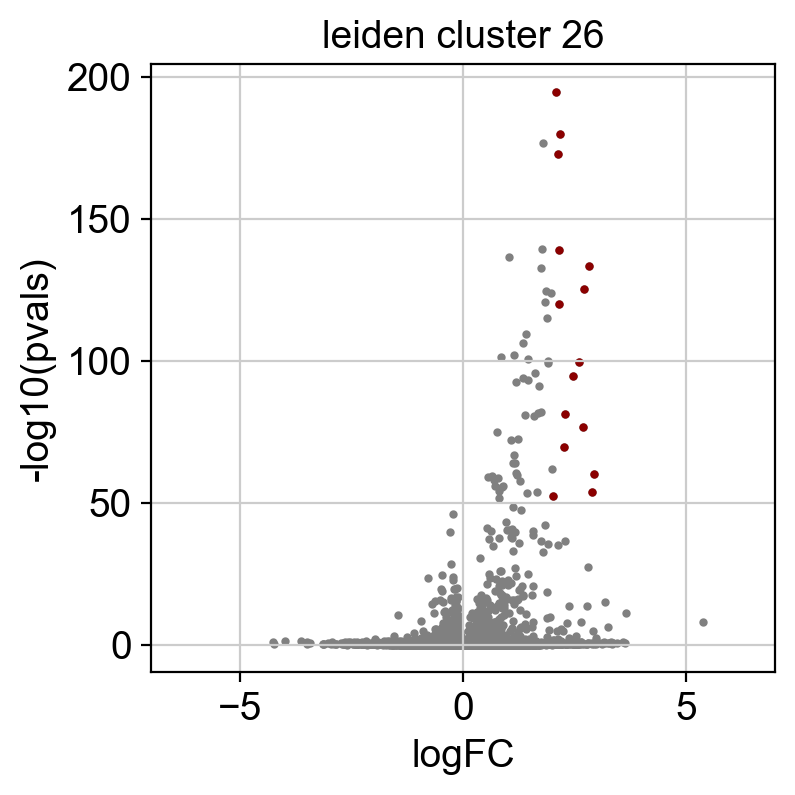

,name,p_value,intersections
0,Hepatitis C,0.000133,"[IFIT1, RSAD2, MX2, CXCL10]"
1,Influenza A,0.003118,"[RSAD2, MX2, CXCL10]"
2,Cytokine-cytokine receptor interaction,0.005468,"[CXCL10, CXCL11, TNFSF13B]"
3,RIG-I-like receptor signaling pathway,0.005468,"[ISG15, CXCL10]"
4,Coronavirus disease - COVID-19,0.005468,"[ISG15, MX2, CXCL10]"
5,Viral protein interaction with cytokine and cy...,0.007699,"[CXCL10, CXCL11]"
6,Toll-like receptor signaling pathway,0.007699,"[CXCL10, CXCL11]"
7,Human papillomavirus infection,0.007699,"[ISG15, MX2, OASL]"
8,KEGG root term,0.022210,"[ISG15, IFIT1, RSAD2, MX2, OASL, CXCL10, CMPK2..."
9,Chemokine signaling pathway,0.022210,"[CXCL10, CXCL11]"


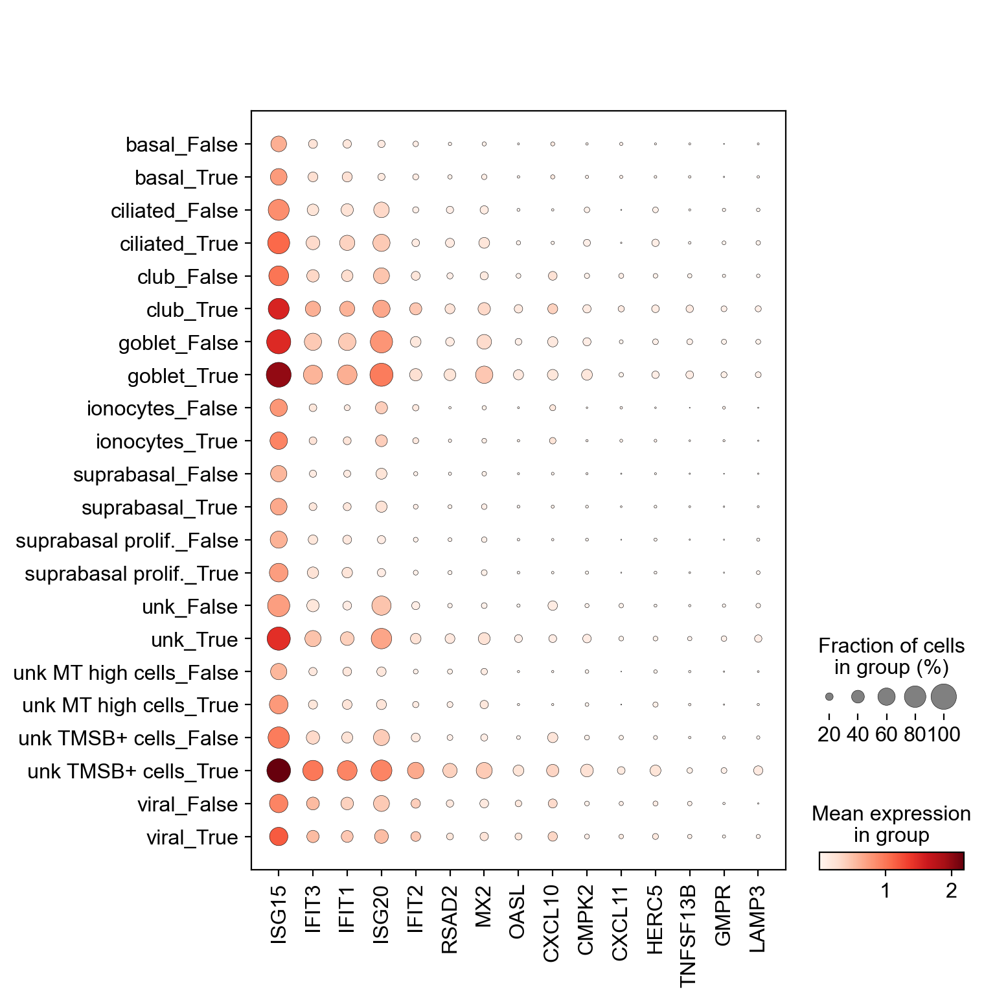

cluster specific markers


/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in log10
  app.launch_new_instance()


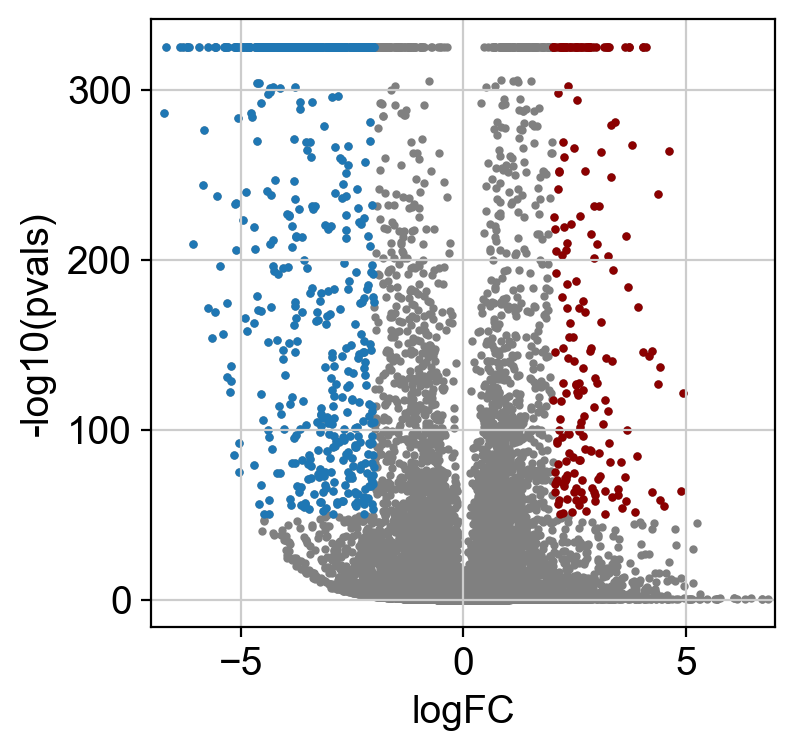

,name,p_value,intersections
0,Focal adhesion,1.737200e-10,"[CAV1, CCND2, ACTN1, ITGB6, ITGA3, FLNA, LAMC2..."
1,ECM-receptor interaction,1.040696e-09,"[ITGB6, ITGA3, LAMC2, ITGAV, LAMA3, FN1, THBS1..."
2,Human papillomavirus infection,1.307920e-06,"[CCND2, ITGB6, ITGA3, LAMC2, ITGAV, LAMA3, FN1..."
3,PI3K-Akt signaling pathway,3.456402e-05,"[CCND2, ITGB6, ITGA3, LAMC2, ITGAV, LAMA3, FN1..."
4,Small cell lung cancer,3.456402e-05,"[ITGA3, LAMC2, ITGAV, LAMA3, FN1, PTGS2, COL4A..."
5,MicroRNAs in cancer,6.080436e-05,"[CCND2, TPM1, PLAU, VIM, FSCN1, PTGS2, THBS1, ..."
6,Proteoglycans in cancer,4.311102e-04,"[CAV1, PLAU, FLNA, ITGAV, MMP2, FN1, THBS1, MS..."
7,Arrhythmogenic right ventricular cardiomyopathy,4.415861e-04,"[ITGB6, ITGA3, ITGAV, GJA1, ITGA5, CDH2, ITGB3]"
8,Complement and coagulation cascades,6.066192e-04,"[PLAU, SERPINA1, PLAT, SERPINE1, PROC, C1S, PR..."
9,Hypertrophic cardiomyopathy,1.028357e-03,"[TPM2, ITGB6, TPM1, ITGA3, ITGAV, ITGA5, ITGB3]"


,name,p_value,intersections
0,Drug metabolism - cytochrome P450,3.004936e-09,"[ADH6, CYP2C19, GSTA5, FMO5, ADH4, FMO3, FMO2,..."
1,Metabolism of xenobiotics by cytochrome P450,4.491826e-07,"[ADH6, GSTA5, ADH4, CYP2A7, ALDH3B1, ALDH3B2, ..."
2,Retinol metabolism,2.596219e-04,"[ADH6, ADH4, CYP2A7, CYP2C9, UGT2A1, CYP2B6, C..."
3,Huntington disease,2.596219e-04,"[COX8C, DNAH2, COX7A1, DNAH3, DNAH9, DNAI2, DN..."
4,Oxidative phosphorylation,2.816400e-04,"[COX8C, COX7A1, ATP6V1C2, MT-ATP8, MT-ND6, MT-..."
5,Chemical carcinogenesis - DNA adducts,4.435955e-03,"[CYP2C19, GSTA5, CYP2A7, CYP2C9, UGT2A1, CYP2A..."
6,Pathways of neurodegeneration - multiple diseases,5.960208e-03,"[COX8C, DNAH2, AXIN2, COX7A1, ATP2A3, CALML4, ..."
7,Amyotrophic lateral sclerosis,6.526401e-03,"[COX8C, NUP210, DNAH2, COX7A1, DNAH3, DNAH9, D..."
8,Diabetic cardiomyopathy,8.855480e-03,"[COX8C, COX7A1, ATP2A3, PLCB4, MT-ATP8, INSR, ..."
9,Chemical carcinogenesis - reactive oxygen species,9.380064e-03,"[COX8C, COX7A1, GSTA5, MT-ATP8, GSTA2, MT-ND6,..."


,name,p_value,intersections
0,Drug metabolism - cytochrome P450,2.865319e-07,"[ADH6, CYP2C19, GSTA5, FMO5, ADH4, FMO3, FMO2,..."
1,Metabolism of xenobiotics by cytochrome P450,2.274216e-05,"[ADH6, GSTA5, ADH4, CYP2A7, ALDH3B1, ALDH3B2, ..."
2,ECM-receptor interaction,8.128194e-04,"[ITGB6, ITGA3, LAMC2, ITGAV, LAMA3, FN1, THBS1..."
3,Huntington disease,2.644245e-03,"[TUBB6, CREB5, SLC1A3, COX8C, DNAH2, COX7A1, D..."
4,Retinol metabolism,3.177871e-03,"[ADH6, ADH4, CYP2A7, CYP2C9, UGT2A1, CYP2B6, C..."
5,Oxidative phosphorylation,8.135803e-03,"[COX8C, COX7A1, ATP6V1C2, MT-ATP8, MT-ND6, MT-..."
6,Chemical carcinogenesis - DNA adducts,8.941292e-03,"[PTGS2, CYP2C19, GSTA5, CYP2A7, CYP2C9, UGT2A1..."
7,Diabetic cardiomyopathy,1.748398e-02,"[RAC2, MMP2, MMP9, COX8C, COX7A1, ATP2A3, PLCB..."
8,Focal adhesion,3.186029e-02,"[CAV1, CCND2, ACTN1, ITGB6, ITGA3, FLNA, LAMC2..."


In [28]:
writer = pd.ExcelWriter('220608_responsive_cluster_DEGs.xlsx', engine='xlsxwriter')

for c in valid_clusters:
    subset = adata[adata.obs.leiden_original == c]
    
    # confirm infection response
    sc.tl.rank_genes_groups(subset, groupby='infected')
    df, up_genes, down_genes = plot_volcano(sc.get.rank_genes_groups_df(subset, group='True'))
    plt.title(f'leiden cluster {c}')
    plt.show()
    if len(up_genes) > 1:
        display(enrich(up_genes, adata.var_names, sources=['KEGG']).head(10))
        sc.pl.dotplot(adata, var_names=up_genes, groupby=['cell_type', 'infected'])
    if len(down_genes) > 1:
        display(enrich(down_genes, adata.var_names, sources=['KEGG']).head(10))
    df.to_excel(writer, sheet_name=f'{c}_infection_DEGs')
        
    # what makes these clusters different?
    print('cluster specific markers')
    df, up_genes, down_genes = plot_volcano(sc.get.rank_genes_groups_df(adata, group=c))
    plt.show()
    if len(up_genes) > 1: display(enrich(up_genes, adata.var_names, sources=['KEGG']).head(10))
    if len(down_genes) > 1: display(enrich(down_genes, adata.var_names, sources=['KEGG']).head(10))
    display(enrich(list(up_genes) + list(down_genes), adata.var_names, sources=['KEGG']).head(10))  # both up and down together in case it's different
    df.to_excel(writer, sheet_name=f'{c}_DEGs')

writer.close()

What is the composition of these clusters/which treatment caused them? (TODO: maybe switch back to subtraction after all, more clear)

20


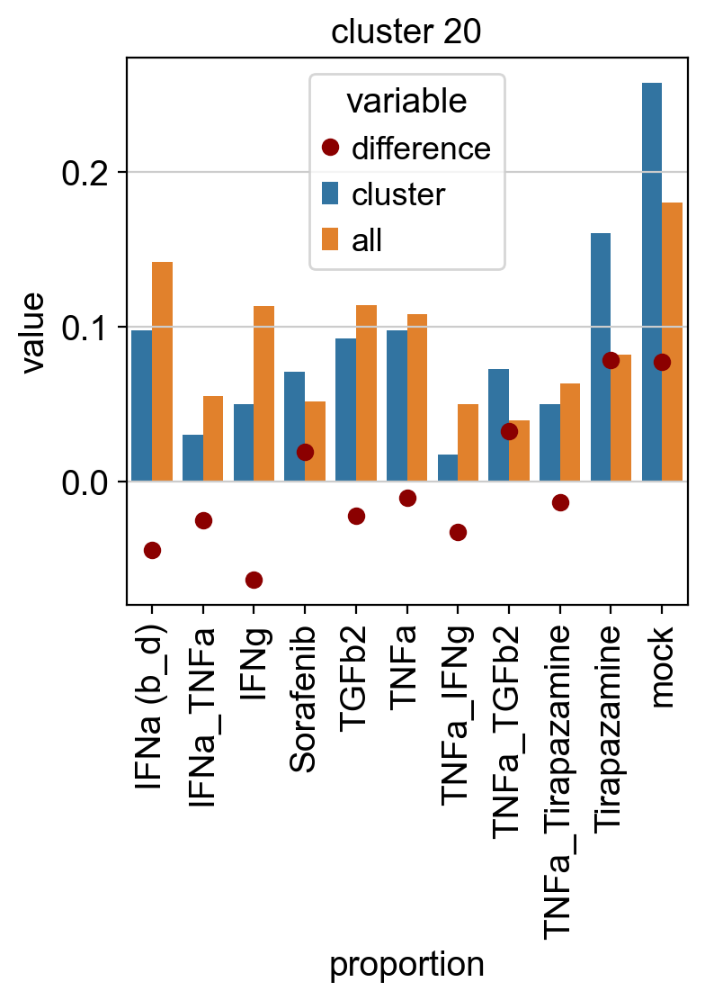

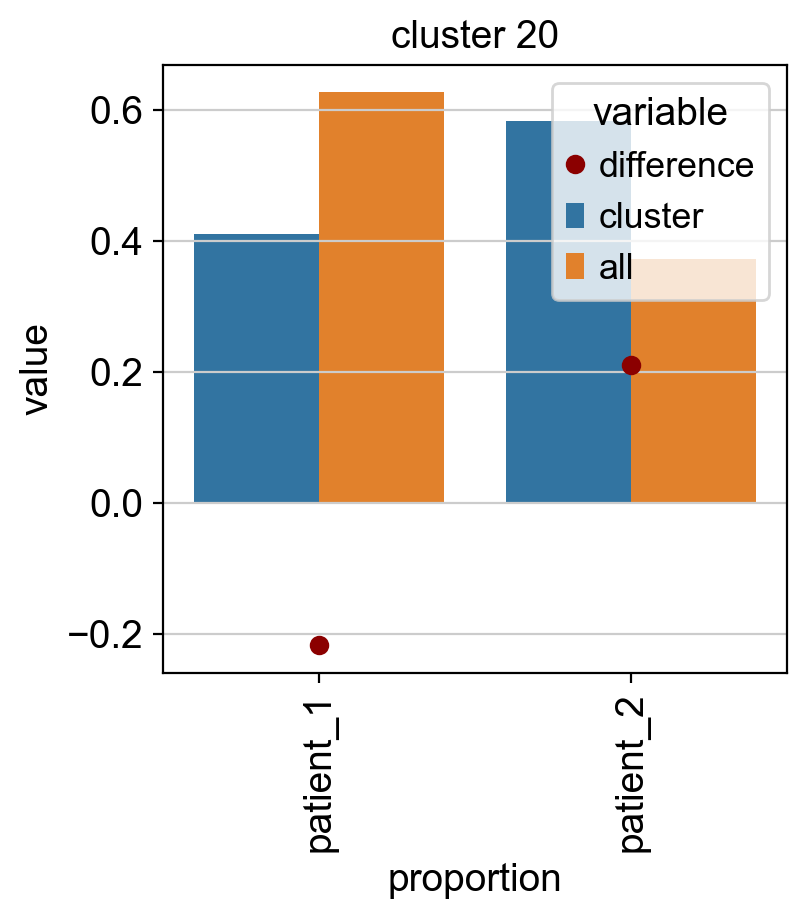

26


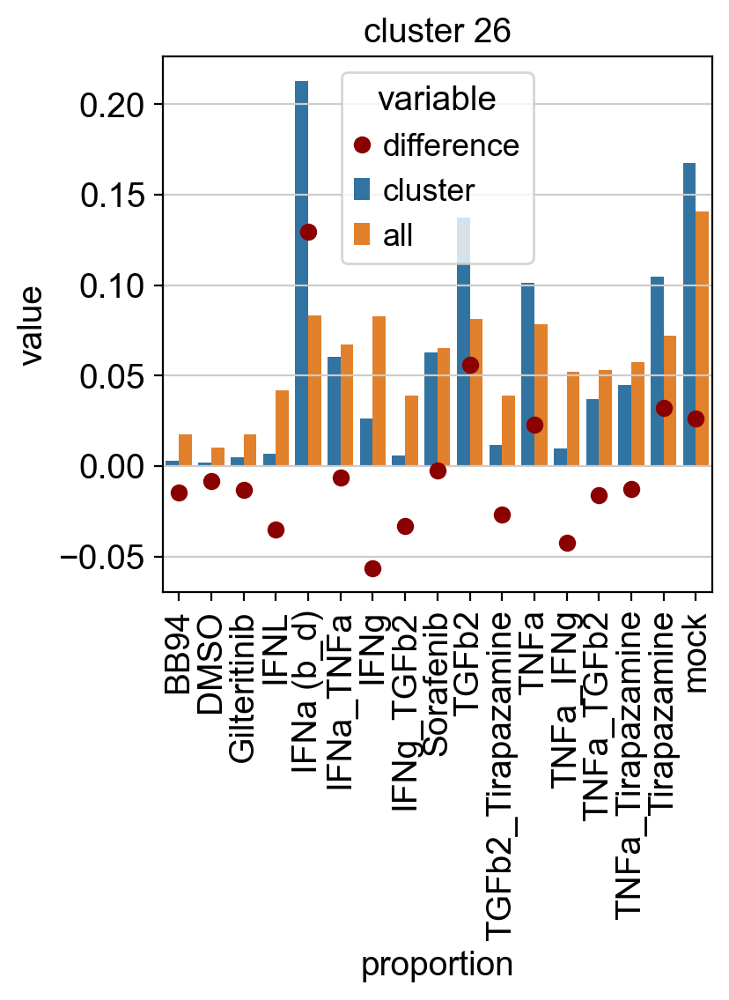

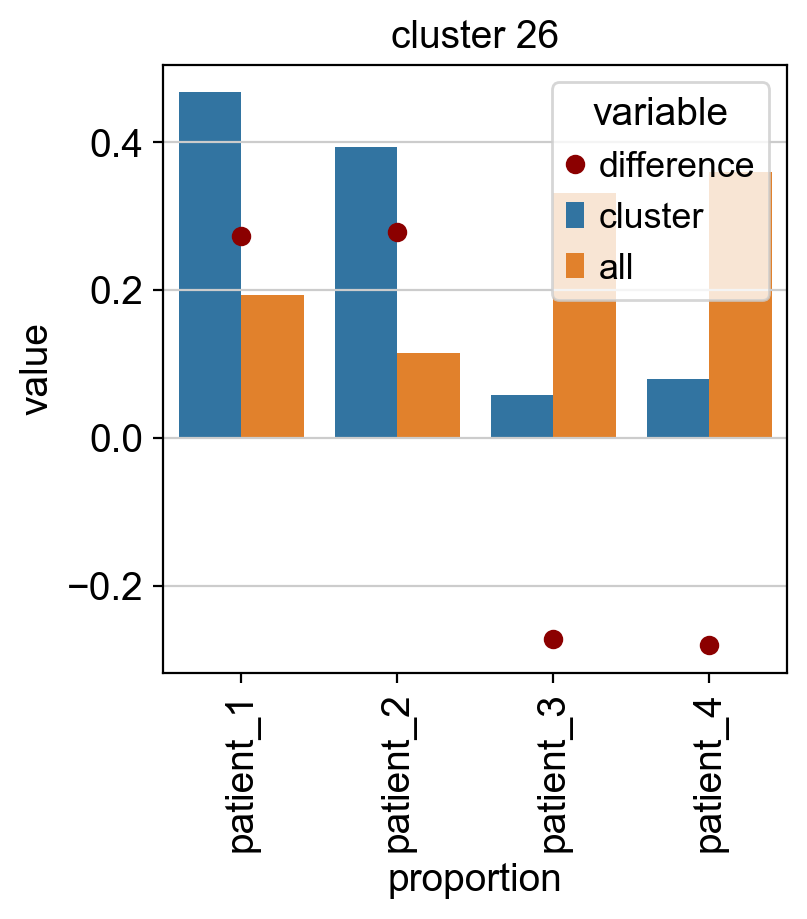

In [58]:
for c in valid_clusters:
    print(c)
    subset = adata[adata.obs.leiden_original == c]
    if c == '20':  # only appears in patients 1 and 2
        sub_a = adata[adata.obs.patient.isin(['patient_1', 'patient_2'])]
    else:
        sub_a = adata

    for gb in ['treatment', 'patient']:
        cats = sub_a.obs[gb].cat.categories
        df1 = pd.DataFrame(subset.obs[gb].value_counts(normalize=True)[cats]).rename({gb:'cluster'}, axis=1)
        df2 = pd.DataFrame(sub_a.obs[gb].value_counts(normalize=True)[cats]).rename({gb:'all'}, axis=1)
        df = pd.concat([df1, df2], axis=1)
        
        # plots
        pd.DataFrame(
            subset.obs[gb].value_counts(normalize=True)[cats] - sub_a.obs[gb].value_counts(normalize=True)[cats]
        ).rename({gb:'difference'}, axis=1).plot(marker='o', linestyle='None', c='darkred', rot=90)
        sns.barplot(data=df.reset_index().rename({'index':gb}, axis=1).melt(id_vars=gb), y='value', x=gb, hue='variable')
        plt.title(f'cluster {c}')
        plt.xlabel('proportion')
        plt.show()

### Hypothesis: cluster 20 and 26 are both NFKB/TNFa pathway primed, but they have different cell type responses

In [272]:
# get TNFa response
from sklearn.linear_model import LogisticRegression

In [ ]:
clf = LogisticRegression()
clf.train(adata[adata.obs])

### From Yiqi: are these really bystanding cells?

<AxesSubplot:xlabel='viral_counts', ylabel='leiden_original'>

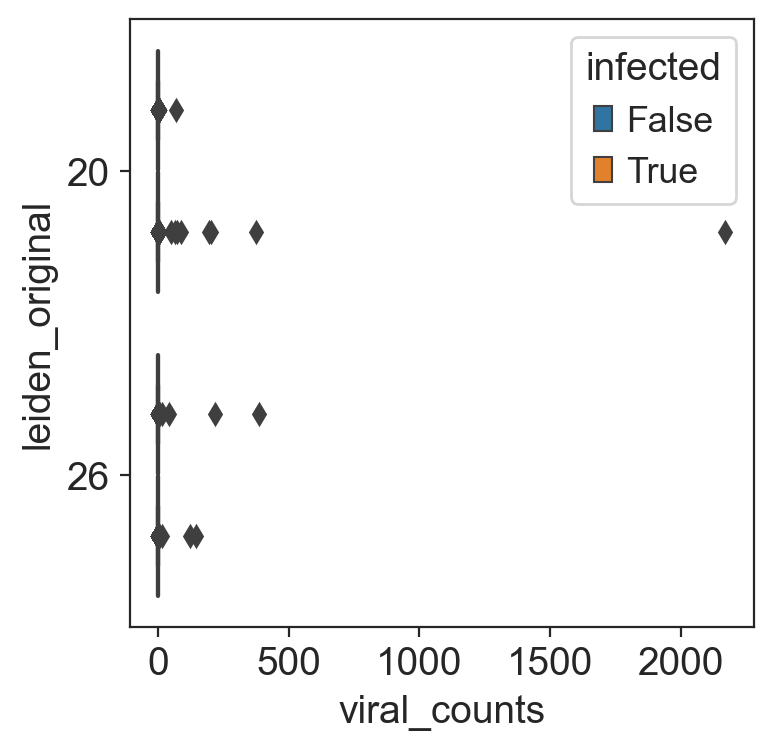

In [260]:
sns.boxplot(data=adata[adata.obs.leiden_original.isin(valid_clusters)].obs, x='viral_counts', y='leiden_original', hue='infected')

In [258]:
adata.obs['log10(viral_counts)'] = np.log10(adata.obs.viral_counts.values)

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log10
  """Entry point for launching an IPython kernel.
Trying to set attribute `.obs` of view, copying.


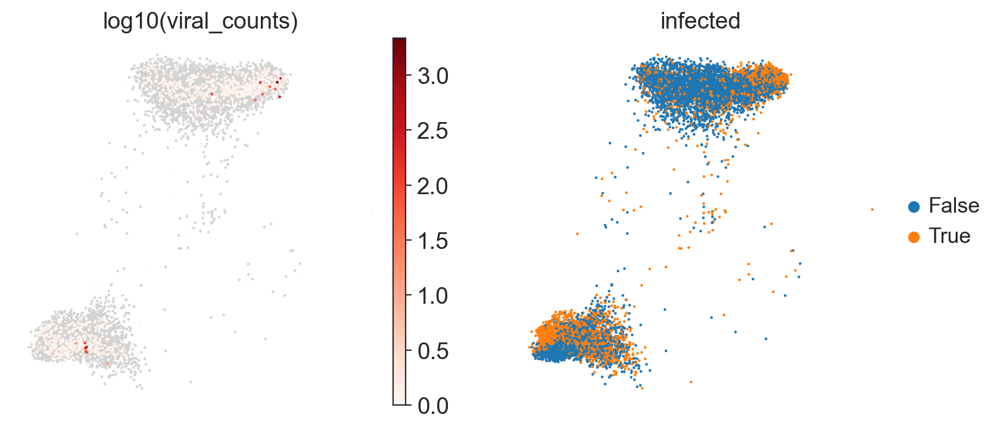

In [261]:
sc.pl.umap(adata[adata.obs.leiden_original.isin(valid_clusters)], color=['log10(viral_counts)', 'infected'], cmap='Reds')

Re-run discarding cells with >0 viral count and the uninfected label.

In [268]:
adata

AnnData object with n_obs × n_vars = 221974 × 18115
    obs: 'identifier', 'patient', 'name', 'barcode_round', 'sample', 'viral_counts', 'treatment', 'treatment_virus', 'infected', 'n_counts', 'n_genes', 'percent_mito', 'percent_viral', 'leiden', 'final_bcs', 'batch', 'celltype_coarse', 'cell_type', 'infection_label', '_scvi_batch', '_scvi_labels', 'celltype_fine', 'leiden_original', 'infection_responsiveness', 'n_genes w/ -log(pval) > 50', 'n_genes w/ -log(pval) > 20', 'log10(viral_counts)'
    var: 'used_for_scvi'
    uns: '_scvi', 'cell_type_colors', 'celltype_fine_colors', 'hvg', 'infected_colors', 'leiden', 'neighbors', 'patient_colors', 'rank_genes_groups', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [269]:
mask = (adata.obs.infected == 'False') & (adata.obs.viral_counts > 0)
adata = adata[~mask]
adata

View of AnnData object with n_obs × n_vars = 210434 × 18115
    obs: 'identifier', 'patient', 'name', 'barcode_round', 'sample', 'viral_counts', 'treatment', 'treatment_virus', 'infected', 'n_counts', 'n_genes', 'percent_mito', 'percent_viral', 'leiden', 'final_bcs', 'batch', 'celltype_coarse', 'cell_type', 'infection_label', '_scvi_batch', '_scvi_labels', 'celltype_fine', 'leiden_original', 'infection_responsiveness', 'n_genes w/ -log(pval) > 50', 'n_genes w/ -log(pval) > 20', 'log10(viral_counts)'
    var: 'used_for_scvi'
    uns: '_scvi', 'cell_type_colors', 'celltype_fine_colors', 'hvg', 'infected_colors', 'leiden', 'neighbors', 'patient_colors', 'rank_genes_groups', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

Trying to set attribute `.uns` of view, copying.


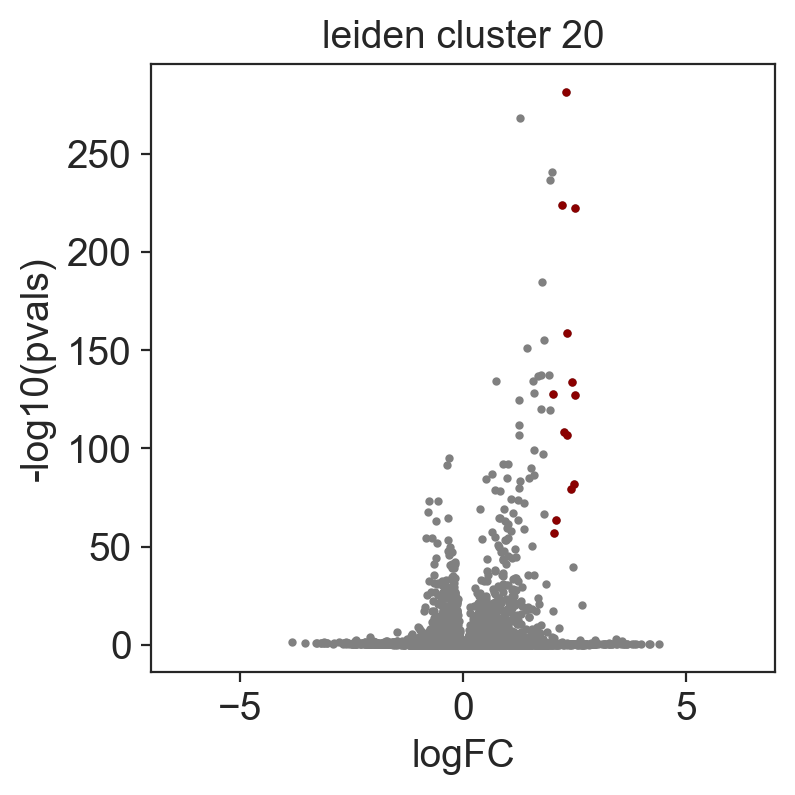

,name,p_value,intersections
0,defense response to virus,2.322596e-14,"[ISG15, IFIT1, IFIT3, MX2, IFIT2, RSAD2, OAS2,..."
1,defense response to symbiont,2.322596e-14,"[ISG15, IFIT1, IFIT3, MX2, IFIT2, RSAD2, OAS2,..."
2,response to virus,3.422206e-13,"[ISG15, IFIT1, IFIT3, MX2, IFIT2, RSAD2, OAS2,..."
3,innate immune response,4.894116e-12,"[ISG15, IFIT1, IFIT3, MX2, IFIT2, RSAD2, OAS2,..."
4,response to external biotic stimulus,1.688688e-11,"[ISG15, IFIT1, IFIT3, MX2, IFIT2, RSAD2, OAS2,..."
5,response to other organism,1.688688e-11,"[ISG15, IFIT1, IFIT3, MX2, IFIT2, RSAD2, OAS2,..."
6,response to biotic stimulus,2.069259e-11,"[ISG15, IFIT1, IFIT3, MX2, IFIT2, RSAD2, OAS2,..."
7,defense response to other organism,3.691144e-11,"[ISG15, IFIT1, IFIT3, MX2, IFIT2, RSAD2, OAS2,..."
8,biological process involved in interspecies in...,3.794211e-11,"[ISG15, IFIT1, IFIT3, MX2, IFIT2, RSAD2, OAS2,..."
9,immune response,6.251769e-11,"[ISG15, IFIT1, IFIT3, MX2, IFIT2, RSAD2, OAS2,..."


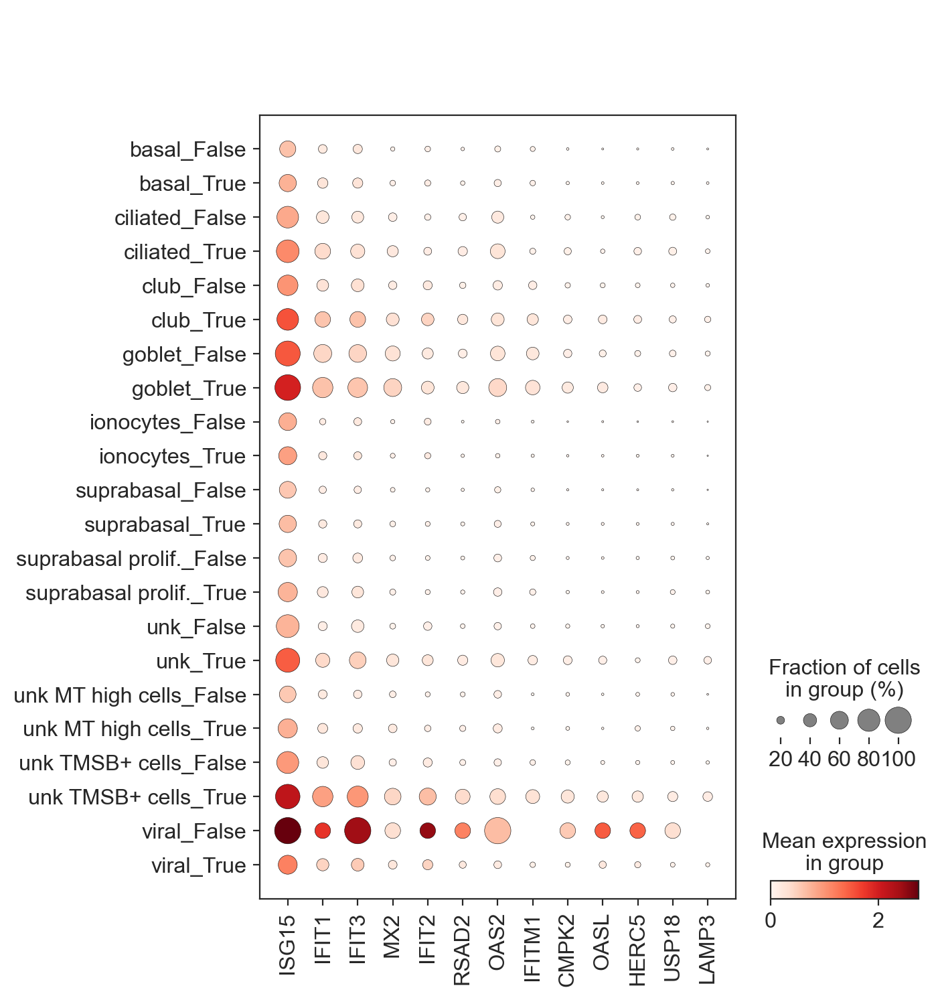

cluster specific markers


/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in log10
  app.launch_new_instance()


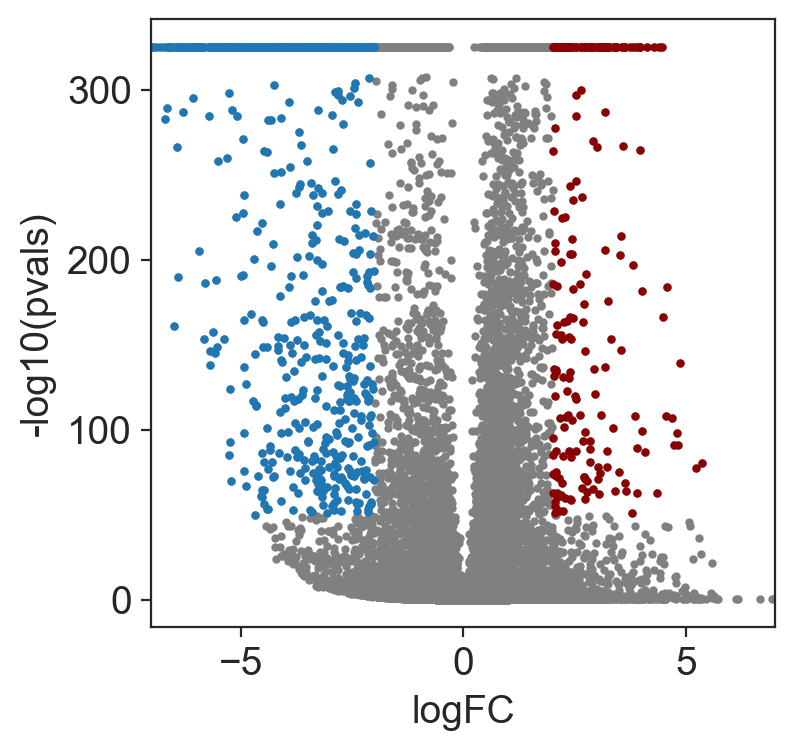

,name,p_value,intersections
0,inflammatory response,9.862728e-15,"[TMSB4X, C3, SAA1, CXCL8, NFKBIA, SAA2, CXCL1,..."
1,cell migration,1.162348e-12,"[TMSB4X, PLAU, SAA1, CXCL8, CEACAM6, CXCL1, BA..."
2,immune system process,2.668616e-12,"[LCN2, CDKN2A, C3, SAA1, CXCL8, NFKBIA, IL32, ..."
3,response to external stimulus,4.779462e-12,"[TMSB4X, LCN2, C3, PLAU, ALDH1A3, SAA1, CXCL8,..."
4,response to lipopolysaccharide,4.779462e-12,"[CXCL8, NFKBIA, CXCL1, CXCL2, TNFAIP3, EDN1, P..."
5,immune response,4.903147e-12,"[LCN2, C3, CXCL8, NFKBIA, IL32, CXCL1, BAX, AN..."
6,defense response,8.998023e-12,"[TMSB4X, LCN2, C3, SAA1, CXCL8, NFKBIA, SAA2, ..."
7,response to molecule of bacterial origin,1.034672e-11,"[CXCL8, NFKBIA, CXCL1, CXCL2, TNFAIP3, EDN1, P..."
8,cell motility,1.056069e-11,"[TMSB4X, PLAU, SAA1, CXCL8, CEACAM6, CXCL1, BA..."
9,response to lipid,1.056069e-11,"[CXCL8, NFKBIA, CXCL1, ANXA3, CXCL2, TNFAIP3, ..."


,name,p_value,intersections
0,microtubule-based process,7.489847e-34,"[KIF18A, PLK4, LRGUK, DZIP1, WNT3A, ESPL1, SKA..."
1,cilium movement,5.668701e-29,"[DZIP1, CFAP61, ROPN1B, CFAP206, TEKT4, CFAP69..."
2,microtubule cytoskeleton organization,4.550528e-27,"[KIF18A, PLK4, LRGUK, DZIP1, WNT3A, ESPL1, SKA..."
3,microtubule-based movement,1.673985e-26,"[KIF18A, DZIP1, CFAP61, ROPN1B, KIF15, KIF24, ..."
4,microtubule bundle formation,5.166983e-25,"[LRGUK, C16orf71, PRC1, CFAP206, PSRC1, NCKAP5..."
5,axoneme assembly,4.041353e-24,"[LRGUK, C16orf71, CFAP206, CFAP69, DNAH2, CFAP..."
6,cilium-dependent cell motility,3.757942e-22,"[DZIP1, ROPN1B, CFAP206, TEKT4, CFAP69, DNAH2,..."
7,cilium or flagellum-dependent cell motility,3.757942e-22,"[DZIP1, ROPN1B, CFAP206, TEKT4, CFAP69, DNAH2,..."
8,cilium organization,1.264037e-19,"[PLK4, LRGUK, DZIP1, CFAP61, C16orf71, ROPN1B,..."
9,cilium assembly,6.414247e-16,"[PLK4, LRGUK, DZIP1, C16orf71, KIF24, CFAP206,..."


,name,p_value,intersections
0,microtubule-based process,1.585846e-24,"[PLK2, MAP1B, KIF3C, TUBB2B, KIF26B, KIF18A, P..."
1,cilium movement,4.484893e-23,"[DZIP1, CFAP61, ROPN1B, CFAP206, TEKT4, CFAP69..."
2,microtubule bundle formation,3.316538e-21,"[MAP1B, LRGUK, C16orf71, PRC1, CFAP206, PSRC1,..."
3,microtubule-based movement,4.028821e-21,"[MAP1B, KIF3C, KIF26B, KIF18A, DZIP1, CFAP61, ..."
4,axoneme assembly,5.110042e-20,"[LRGUK, C16orf71, CFAP206, CFAP69, DNAH2, CFAP..."
5,microtubule cytoskeleton organization,5.701127e-20,"[PLK2, MAP1B, TUBB2B, KIF18A, PLK4, LRGUK, DZI..."
6,cilium-dependent cell motility,1.533940e-17,"[DZIP1, ROPN1B, CFAP206, TEKT4, CFAP69, DNAH2,..."
7,cilium or flagellum-dependent cell motility,1.533940e-17,"[DZIP1, ROPN1B, CFAP206, TEKT4, CFAP69, DNAH2,..."
8,movement of cell or subcellular component,4.462435e-16,"[TMSB4X, PLAU, SAA1, CXCL8, CEACAM6, CXCL1, BA..."
9,cilium organization,3.614357e-14,"[ABLIM3, PLK4, LRGUK, DZIP1, CFAP61, C16orf71,..."


Trying to set attribute `.uns` of view, copying.


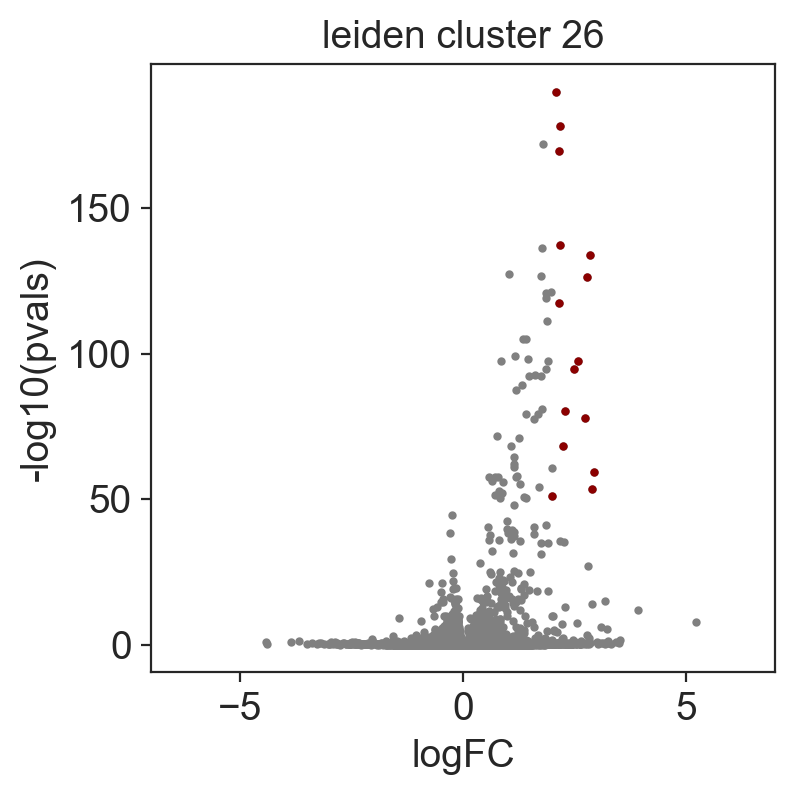

,name,p_value,intersections
0,defense response to virus,3.327534e-13,"[ISG15, IFIT3, IFIT1, ISG20, IFIT2, RSAD2, MX2..."
1,defense response to symbiont,3.327534e-13,"[ISG15, IFIT3, IFIT1, ISG20, IFIT2, RSAD2, MX2..."
2,response to virus,4.856689e-12,"[ISG15, IFIT3, IFIT1, ISG20, IFIT2, RSAD2, MX2..."
3,immune response,1.334836e-10,"[ISG15, IFIT3, IFIT1, ISG20, IFIT2, RSAD2, MX2..."
4,response to other organism,7.234030e-10,"[ISG15, IFIT3, IFIT1, ISG20, IFIT2, RSAD2, MX2..."
5,response to external biotic stimulus,7.234030e-10,"[ISG15, IFIT3, IFIT1, ISG20, IFIT2, RSAD2, MX2..."
6,response to biotic stimulus,8.826872e-10,"[ISG15, IFIT3, IFIT1, ISG20, IFIT2, RSAD2, MX2..."
7,biological process involved in interspecies in...,1.801371e-09,"[ISG15, IFIT3, IFIT1, ISG20, IFIT2, RSAD2, MX2..."
8,innate immune response,2.600799e-09,"[ISG15, IFIT3, IFIT1, ISG20, IFIT2, RSAD2, MX2..."
9,response to cytokine,1.380575e-08,"[ISG15, IFIT3, IFIT1, IFIT2, MX2, OASL, CXCL10..."


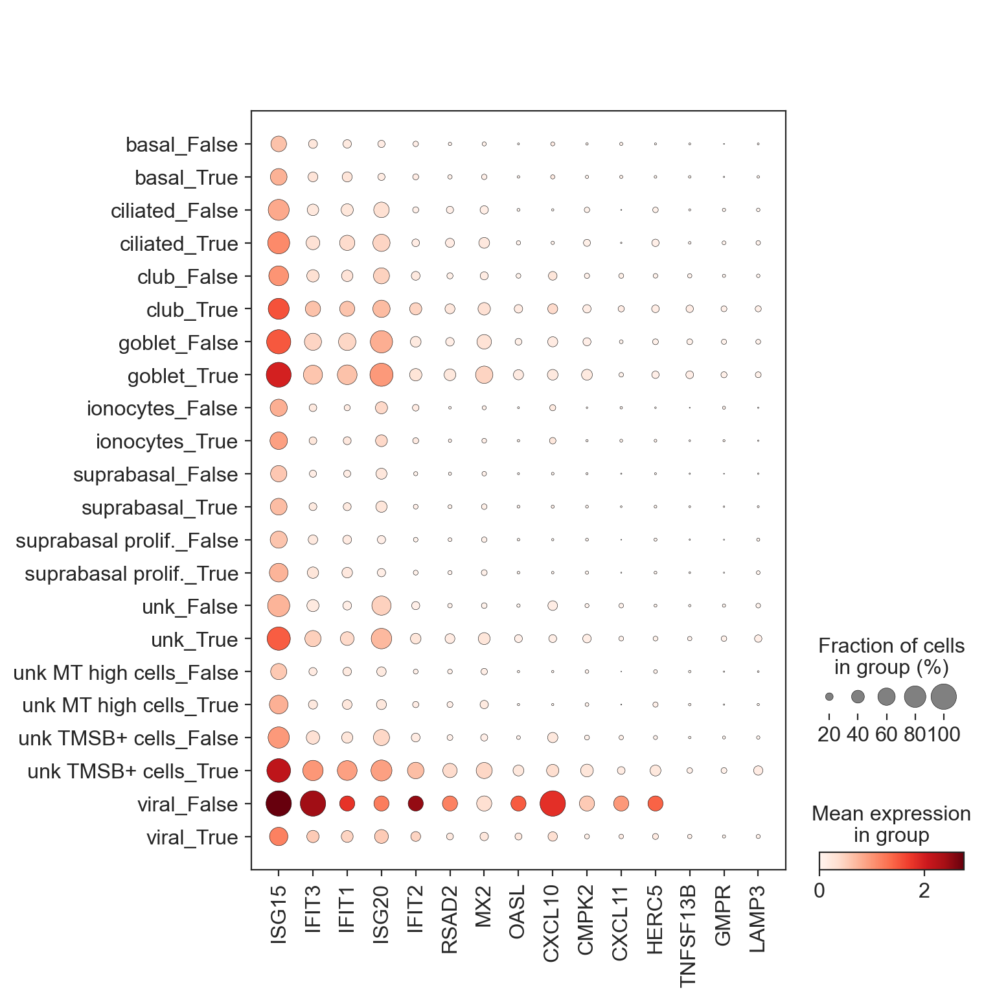

cluster specific markers


/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in log10
  app.launch_new_instance()


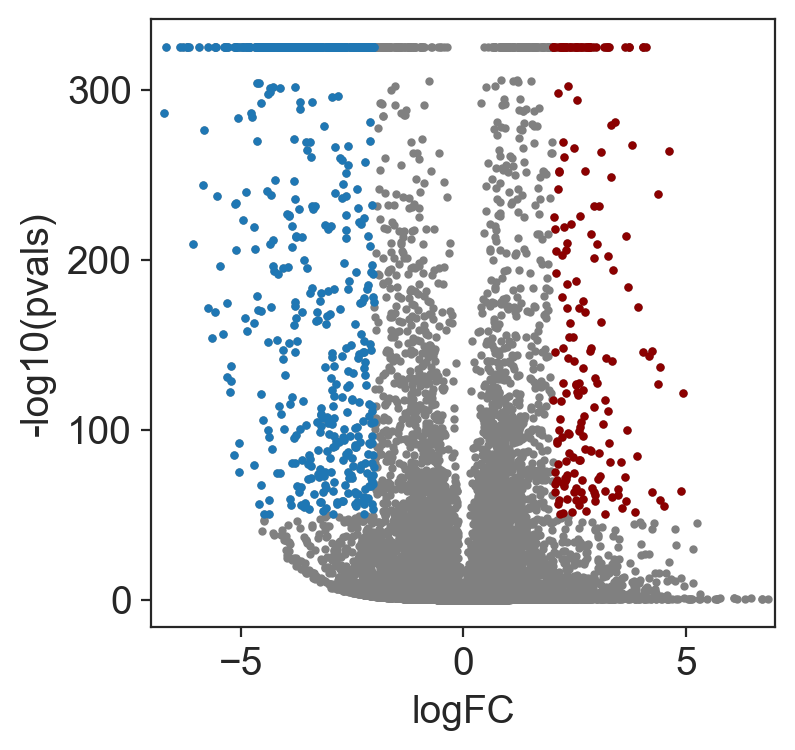

,name,p_value,intersections
0,biological adhesion,4.306533e-24,"[S100A10, IGFBP7, IGFBP2, TNFRSF12A, LGALS1, C..."
1,cell adhesion,4.306533e-24,"[S100A10, IGFBP7, IGFBP2, TNFRSF12A, LGALS1, C..."
2,anatomical structure morphogenesis,9.399052e-19,"[S100A10, KRT17, TNFRSF12A, CTSH, CALD1, CAV1,..."
3,extracellular structure organization,1.165847e-18,"[CAV1, COL17A1, ITGB6, MMP13, ITGA3, ITGAV, LO..."
4,extracellular matrix organization,1.165847e-18,"[CAV1, COL17A1, ITGB6, MMP13, ITGA3, ITGAV, LO..."
5,external encapsulating structure organization,1.184945e-18,"[CAV1, COL17A1, ITGB6, MMP13, ITGA3, ITGAV, LO..."
6,cell migration,3.041533e-18,"[S100A2, CTSH, IGFBP6, TIMP1, CAV1, ITGB6, TPM..."
7,anatomical structure formation involved in mor...,3.060088e-18,"[TNFRSF12A, CTSH, CALD1, CAV1, ACTN1, FHL2, IT..."
8,localization of cell,6.846867e-18,"[S100A2, CTSH, IGFBP6, TIMP1, CAV1, ITGB6, TPM..."
9,cell motility,6.846867e-18,"[S100A2, CTSH, IGFBP6, TIMP1, CAV1, ITGB6, TPM..."


,name,p_value,intersections
0,cilium movement,1.241811e-33,"[SLC26A8, TACR1, CFAP206, CFAP61, TEKT3, ROPN1..."
1,axoneme assembly,3.508332e-28,"[CFAP206, DNAH2, CCDC40, CFAP69, LRGUK, DNAJB1..."
2,microtubule-based movement,2.866695e-27,"[KIF17, SLC26A8, CNIH2, TACR1, CFAP206, CFAP61..."
3,microtubule bundle formation,5.386881e-27,"[PLK1, CFAP206, KIF20A, DNAH2, CCDC40, CFAP69,..."
4,cilium-dependent cell motility,4.136261e-24,"[SLC26A8, TACR1, CFAP206, TEKT3, ROPN1B, DNAH2..."
5,cilium or flagellum-dependent cell motility,4.136261e-24,"[SLC26A8, TACR1, CFAP206, TEKT3, ROPN1B, DNAH2..."
6,microtubule-based process,2.474415e-22,"[KIF17, PLK1, SLC26A8, CNIH2, TACR1, AURKB, CF..."
7,cilium movement involved in cell motility,1.740866e-18,"[SLC26A8, TACR1, CFAP206, TEKT3, ROPN1B, CCDC4..."
8,cilium organization,6.340551e-18,"[CFAP206, CFAP61, TEKT3, GMNC, ROPN1B, DNAH2, ..."
9,flagellated sperm motility,7.537415e-15,"[SLC26A8, TACR1, CFAP206, TEKT3, ROPN1B, CCDC4..."


,name,p_value,intersections
0,cilium movement,1.980554e-28,"[PLTP, SLC26A8, TACR1, CFAP206, CFAP61, TEKT3,..."
1,axoneme assembly,7.029422e-24,"[CFAP206, DNAH2, CCDC40, CFAP69, LRGUK, DNAJB1..."
2,microtubule bundle formation,2.632465e-23,"[MAP2, PLK1, CFAP206, KIF20A, DNAH2, CCDC40, C..."
3,microtubule-based movement,2.558367e-22,"[FEZ1, PLTP, MAP2, KIF17, SLC26A8, CNIH2, TACR..."
4,cilium-dependent cell motility,2.021156e-20,"[PLTP, SLC26A8, TACR1, CFAP206, TEKT3, ROPN1B,..."
5,cilium or flagellum-dependent cell motility,2.021156e-20,"[PLTP, SLC26A8, TACR1, CFAP206, TEKT3, ROPN1B,..."
6,movement of cell or subcellular component,1.286039e-18,"[S100A2, CTSH, IGFBP6, TIMP1, CAV1, ACTN1, ITG..."
7,microtubule-based process,1.725902e-17,"[FLNA, TUBB6, GJA1, FEZ1, PLTP, SLC16A1, PHLDB..."
8,cilium movement involved in cell motility,1.223820e-15,"[PLTP, SLC26A8, TACR1, CFAP206, TEKT3, ROPN1B,..."
9,localization of cell,1.859181e-14,"[S100A2, CTSH, IGFBP6, TIMP1, CAV1, ITGB6, TPM..."


In [270]:
for c in valid_clusters:
    subset = adata[adata.obs.leiden_original == c]
    
    # confirm infection response
    sc.tl.rank_genes_groups(subset, groupby='infected')
    df, up_genes, down_genes = plot_volcano(sc.get.rank_genes_groups_df(subset, group='True'))
    plt.title(f'leiden cluster {c}')
    plt.show()
    if len(up_genes) > 1:
        display(enrich(up_genes, adata.var_names).head(10))
        sc.pl.dotplot(adata, var_names=up_genes, groupby=['cell_type', 'infected'])
    if len(down_genes) > 1:
        display(enrich(down_genes, adata.var_names).head(10))
        
    # what makes these clusters different?
    print('cluster specific markers')
    df, up_genes, down_genes = plot_volcano(sc.get.rank_genes_groups_df(adata, group=c))
    plt.show()
    if len(up_genes) > 1: display(enrich(up_genes, adata.var_names).head(10))
    if len(down_genes) > 1: display(enrich(down_genes, adata.var_names).head(10))
    display(enrich(list(up_genes) + list(down_genes), adata.var_names).head(10))  # both up and down together in case it's different

Does seem to change the differentially expressed genes, but only slightly?